<!-- Autogenerated by `scripts/make_examples.py` -->
<table align="left">
    <td>
        <a target="_blank" href="https://colab.research.google.com/github/voxel51/fiftyone-examples/blob/master/examples/pytorch_detection_training.ipynb">
            <img src="https://user-images.githubusercontent.com/25985824/104791629-6e618700-5769-11eb-857f-d176b37d2496.png" height="32" width="32">
            Try in Google Colab
        </a>
    </td>
    <td>
        <a target="_blank" href="https://nbviewer.jupyter.org/github/voxel51/fiftyone-examples/blob/master/examples/pytorch_detection_training.ipynb">
            <img src="https://user-images.githubusercontent.com/25985824/104791634-6efa1d80-5769-11eb-8a4c-71d6cb53ccf0.png" height="32" width="32">
            Share via nbviewer
        </a>
    </td>
    <td>
        <a target="_blank" href="https://github.com/voxel51/fiftyone-examples/blob/master/examples/pytorch_detection_training.ipynb">
            <img src="https://user-images.githubusercontent.com/25985824/104791633-6efa1d80-5769-11eb-8ee3-4b2123fe4b66.png" height="32" width="32">
            View on GitHub
        </a>
    </td>
    <td>
        <a href="https://github.com/voxel51/fiftyone-examples/raw/master/examples/pytorch_detection_training.ipynb" download>
            <img src="https://user-images.githubusercontent.com/25985824/104792428-60f9cc00-576c-11eb-95a4-5709d803023a.png" height="32" width="32">
            Download notebook
        </a>
    </td>
</table>


# PyTorch object detection model training

[PyTorch](https://pytorch.org/) datasets provide a great starting point for loading complex datasets, letting you define a class to load individual samples from disk and then creating data loaders to efficiently supply the data to your model. Problems arise when you want to start iterating over your dataset itself. PyTorch datasets are fairly rigid and require you to either rewrite them or the underlying data on disk if you want to make any changes to the data you are training or testing your model on. That is where [FiftyOne](http://fiftyone.ai) comes in.

PyTorch datasets can synergize well with [FiftyOne datasets](https://voxel51.com/docs/fiftyone/user_guide/using_datasets.html#using-fiftyone-datasets) for hard computer vision problems like [classification, object detection, segmentation, and more](https://voxel51.com/docs/fiftyone/user_guide/using_datasets.html#labels).
The flexibility of FiftyOne datasets lets you easily experiment with and finetune the datasets you use for training and testing to create better-performing models, faster.
In this example, I am focusing on object detection since that is one of the most common vision tasks while also being fairly complex. However, these methods work for most machine learning tasks. Specifically, this notebook covers:
* Loading your labeled dataset into FiftyOne
* Writing a PyTorch object detection dataset that utilizes your loaded FiftyOne dataset
* Exploring views into your FiftyOne dataset for training and evaluation
* Training a Torchvision object detection model on your FiftyOne dataset views
* Evaluating your models in FiftyOne to refine your dataset

## Setup

To start, we need to install FiftyOne:

*If you're working in Google Colab, be sure to [enable a GPU runtime](https://colab.research.google.com/drive/1P7okDVh6viCIOkii6UAF2O9sTAcKGNWq) before running any cell*

In [3]:
!pip install git+https://github.com/deepvision-class/starter-code

  Cloning https://github.com/deepvision-class/starter-code to /tmp/pip-req-build-a4g9fe_m
  Running command git clone --filter=blob:none --quiet https://github.com/deepvision-class/starter-code /tmp/pip-req-build-a4g9fe_m
  Resolved https://github.com/deepvision-class/starter-code to commit e8d9fe711870a39796a2f8ad95538e57942d756f
  Preparing metadata (setup.py) ... done
  Created wheel for Colab-Utils: filename=Colab_Utils-0.1.dev0-py3-none-any.whl size=10264 sha256=70508a85cc5f404d19189765d2d627c568db8b3b242ed7830d8f0809f2f21367
  Stored in directory: /tmp/pip-ephem-wheel-cache-w1k9f34w/wheels/c9/fa/82/64b6c443adccf6982835123e4300fc4420373c553439ff0ad5
Successfully built Colab-Utils


In [4]:
!pip install fiftyone

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 27.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.9/59.9 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.9/108.9 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.6/70.6 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 677.2/677.2 kB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.5/192.5 kB 21.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.6/89.6 kB 9.7 MB/s eta 0:00:00
  Installing build dependenci

In [5]:
!pip install torch torchvision

We'll also need pytorch, and torchvision, as well as clone the torchvision GitHub repository to use the training and evaluation utilities provided for the [Torchvision Object Deteciton Tutorial](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html#defining-the-dataset) that we are using to train a basic object detection model.

In [6]:
%%sh

# Download TorchVision repo to use some files from
# references/detection
git clone https://github.com/pytorch/vision.git
cd vision
git checkout v0.3.0

cp references/detection/utils.py ../
cp references/detection/transforms.py ../
# cp references/detection/engine.py ../
# cp references/detection/coco_eval.py ../ #change the torch._six to six
cp references/detection/coco_utils.py ../

Cloning into 'vision'...
Note: switching to 'v0.3.0'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by switching back to a branch.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -c with the switch command. Example:

  git switch -c <new-branch-name>

Or undo this operation with:

  git switch -

Turn off this advice by setting config variable advice.detachedHead to false

HEAD is now at be376084d8 version check against PyTorch's CUDA version


In [7]:
import math
import sys
import time
import torch

import torchvision.models.detection.mask_rcnn

from coco_utils import get_coco_api_from_dataset
import utils


def train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq):
    model.train()
    metric_logger = utils.MetricLogger(delimiter="  ")
    metric_logger.add_meter('lr', utils.SmoothedValue(window_size=1, fmt='{value:.6f}'))
    header = 'Epoch: [{}]'.format(epoch)

    lr_scheduler = None
    if epoch == 0:
        warmup_factor = 1. / 1000
        warmup_iters = min(1000, len(data_loader) - 1)

        lr_scheduler = utils.warmup_lr_scheduler(optimizer, warmup_iters, warmup_factor)

    for images, targets in metric_logger.log_every(data_loader, print_freq, header):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())

        # reduce losses over all GPUs for logging purposes
        loss_dict_reduced = utils.reduce_dict(loss_dict)
        losses_reduced = sum(loss for loss in loss_dict_reduced.values())

        loss_value = losses_reduced.item()

        if not math.isfinite(loss_value):
            print("Loss is {}, stopping training".format(loss_value))
            print(loss_dict_reduced)
            sys.exit(1)

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        if lr_scheduler is not None:
            lr_scheduler.step()

        metric_logger.update(loss=losses_reduced, **loss_dict_reduced)
        metric_logger.update(lr=optimizer.param_groups[0]["lr"])


def _get_iou_types(model):
    model_without_ddp = model
    if isinstance(model, torch.nn.parallel.DistributedDataParallel):
        model_without_ddp = model.module
    iou_types = ["bbox"]
    if isinstance(model_without_ddp, torchvision.models.detection.MaskRCNN):
        iou_types.append("segm")
    if isinstance(model_without_ddp, torchvision.models.detection.KeypointRCNN):
        iou_types.append("keypoints")
    return iou_types


@torch.no_grad()
def evaluate(model, data_loader, device):
    n_threads = torch.get_num_threads()
    # FIXME remove this and make paste_masks_in_image run on the GPU
    torch.set_num_threads(1)
    cpu_device = torch.device("cpu")
    model.eval()
    metric_logger = utils.MetricLogger(delimiter="  ")
    header = 'Test:'

    coco = get_coco_api_from_dataset(data_loader.dataset)
    iou_types = _get_iou_types(model)
    coco_evaluator = CocoEvaluator(coco, iou_types)

    for image, targets in metric_logger.log_every(data_loader, 100, header):
        image = list(img.to(device) for img in image)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        torch.cuda.synchronize()
        model_time = time.time()
        outputs = model(image)

        outputs = [{k: v.to(cpu_device) for k, v in t.items()} for t in outputs]
        model_time = time.time() - model_time

        res = {target["image_id"].item(): output for target, output in zip(targets, outputs)}
        evaluator_time = time.time()
        coco_evaluator.update(res)
        evaluator_time = time.time() - evaluator_time
        metric_logger.update(model_time=model_time, evaluator_time=evaluator_time)

    # gather the stats from all processes
    metric_logger.synchronize_between_processes()
    print("Averaged stats:", metric_logger)
    coco_evaluator.synchronize_between_processes()

    # accumulate predictions from all images
    coco_evaluator.accumulate()
    coco_evaluator.summarize()
    torch.set_num_threads(n_threads)
    return coco_evaluator


In [8]:
import json
import tempfile

import numpy as np
import copy
import time
import torch
import six

from pycocotools.cocoeval import COCOeval
from pycocotools.coco import COCO
import pycocotools.mask as mask_util

from collections import defaultdict

import utils


class CocoEvaluator(object):
    def __init__(self, coco_gt, iou_types):
        assert isinstance(iou_types, (list, tuple))
        coco_gt = copy.deepcopy(coco_gt)
        self.coco_gt = coco_gt

        self.iou_types = iou_types
        self.coco_eval = {}
        for iou_type in iou_types:
            self.coco_eval[iou_type] = COCOeval(coco_gt, iouType=iou_type)

        self.img_ids = []
        self.eval_imgs = {k: [] for k in iou_types}

    def update(self, predictions):
        img_ids = list(np.unique(list(predictions.keys())))
        self.img_ids.extend(img_ids)

        for iou_type in self.iou_types:
            results = self.prepare(predictions, iou_type)
            coco_dt = loadRes(self.coco_gt, results) if results else COCO()
            coco_eval = self.coco_eval[iou_type]

            coco_eval.cocoDt = coco_dt
            coco_eval.params.imgIds = list(img_ids)
            img_ids, eval_imgs = evaluate(coco_eval)

            self.eval_imgs[iou_type].append(eval_imgs)

    def synchronize_between_processes(self):
        for iou_type in self.iou_types:
            self.eval_imgs[iou_type] = np.concatenate(self.eval_imgs[iou_type], 2)
            create_common_coco_eval(self.coco_eval[iou_type], self.img_ids, self.eval_imgs[iou_type])

    def accumulate(self):
        for coco_eval in self.coco_eval.values():
            coco_eval.accumulate()

    def summarize(self):
        for iou_type, coco_eval in self.coco_eval.items():
            print("IoU metric: {}".format(iou_type))
            coco_eval.summarize()

    def prepare(self, predictions, iou_type):
        if iou_type == "bbox":
            return self.prepare_for_coco_detection(predictions)
        elif iou_type == "segm":
            return self.prepare_for_coco_segmentation(predictions)
        elif iou_type == "keypoints":
            return self.prepare_for_coco_keypoint(predictions)
        else:
            raise ValueError("Unknown iou type {}".format(iou_type))

    def prepare_for_coco_detection(self, predictions):
        coco_results = []
        for original_id, prediction in predictions.items():
            if len(prediction) == 0:
                continue

            boxes = prediction["boxes"]
            boxes = convert_to_xywh(boxes).tolist()
            scores = prediction["scores"].tolist()
            labels = prediction["labels"].tolist()

            coco_results.extend(
                [
                    {
                        "image_id": original_id,
                        "category_id": labels[k],
                        "bbox": box,
                        "score": scores[k],
                    }
                    for k, box in enumerate(boxes)
                ]
            )
        return coco_results

    def prepare_for_coco_segmentation(self, predictions):
        coco_results = []
        for original_id, prediction in predictions.items():
            if len(prediction) == 0:
                continue

            scores = prediction["scores"]
            labels = prediction["labels"]
            masks = prediction["masks"]

            masks = masks > 0.5

            scores = prediction["scores"].tolist()
            labels = prediction["labels"].tolist()

            rles = [
                mask_util.encode(np.array(mask[0, :, :, np.newaxis], order="F"))[0]
                for mask in masks
            ]
            for rle in rles:
                rle["counts"] = rle["counts"].decode("utf-8")

            coco_results.extend(
                [
                    {
                        "image_id": original_id,
                        "category_id": labels[k],
                        "segmentation": rle,
                        "score": scores[k],
                    }
                    for k, rle in enumerate(rles)
                ]
            )
        return coco_results

    def prepare_for_coco_keypoint(self, predictions):
        coco_results = []
        for original_id, prediction in predictions.items():
            if len(prediction) == 0:
                continue

            boxes = prediction["boxes"]
            boxes = convert_to_xywh(boxes).tolist()
            scores = prediction["scores"].tolist()
            labels = prediction["labels"].tolist()
            keypoints = prediction["keypoints"]
            keypoints = keypoints.flatten(start_dim=1).tolist()

            coco_results.extend(
                [
                    {
                        "image_id": original_id,
                        "category_id": labels[k],
                        'keypoints': keypoint,
                        "score": scores[k],
                    }
                    for k, keypoint in enumerate(keypoints)
                ]
            )
        return coco_results


def convert_to_xywh(boxes):
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)


def merge(img_ids, eval_imgs):
    all_img_ids = utils.all_gather(img_ids)
    all_eval_imgs = utils.all_gather(eval_imgs)

    merged_img_ids = []
    for p in all_img_ids:
        merged_img_ids.extend(p)

    merged_eval_imgs = []
    for p in all_eval_imgs:
        merged_eval_imgs.append(p)

    merged_img_ids = np.array(merged_img_ids)
    merged_eval_imgs = np.concatenate(merged_eval_imgs, 2)

    # keep only unique (and in sorted order) images
    merged_img_ids, idx = np.unique(merged_img_ids, return_index=True)
    merged_eval_imgs = merged_eval_imgs[..., idx]

    return merged_img_ids, merged_eval_imgs


def create_common_coco_eval(coco_eval, img_ids, eval_imgs):
    img_ids, eval_imgs = merge(img_ids, eval_imgs)
    img_ids = list(img_ids)
    eval_imgs = list(eval_imgs.flatten())

    coco_eval.evalImgs = eval_imgs
    coco_eval.params.imgIds = img_ids
    coco_eval._paramsEval = copy.deepcopy(coco_eval.params)


#################################################################
# From pycocotools, just removed the prints and fixed
# a Python3 bug about unicode not defined
#################################################################

# Ideally, pycocotools wouldn't have hard-coded prints
# so that we could avoid copy-pasting those two functions

def createIndex(self):
    # create index
    # print('creating index...')
    anns, cats, imgs = {}, {}, {}
    imgToAnns, catToImgs = defaultdict(list), defaultdict(list)
    if 'annotations' in self.dataset:
        for ann in self.dataset['annotations']:
            imgToAnns[ann['image_id']].append(ann)
            anns[ann['id']] = ann

    if 'images' in self.dataset:
        for img in self.dataset['images']:
            imgs[img['id']] = img

    if 'categories' in self.dataset:
        for cat in self.dataset['categories']:
            cats[cat['id']] = cat

    if 'annotations' in self.dataset and 'categories' in self.dataset:
        for ann in self.dataset['annotations']:
            catToImgs[ann['category_id']].append(ann['image_id'])

    # print('index created!')

    # create class members
    self.anns = anns
    self.imgToAnns = imgToAnns
    self.catToImgs = catToImgs
    self.imgs = imgs
    self.cats = cats


maskUtils = mask_util


def loadRes(self, resFile):
    """
    Load result file and return a result api object.
    :param   resFile (str)     : file name of result file
    :return: res (obj)         : result api object
    """
    res = COCO()
    res.dataset['images'] = [img for img in self.dataset['images']]

    # print('Loading and preparing results...')
    # tic = time.time()
    if isinstance(resFile, six.string_classes):
        anns = json.load(open(resFile))
    elif type(resFile) == np.ndarray:
        anns = self.loadNumpyAnnotations(resFile)
    else:
        anns = resFile
    assert type(anns) == list, 'results in not an array of objects'
    annsImgIds = [ann['image_id'] for ann in anns]
    assert set(annsImgIds) == (set(annsImgIds) & set(self.getImgIds())), \
        'Results do not correspond to current coco set'
    if 'caption' in anns[0]:
        imgIds = set([img['id'] for img in res.dataset['images']]) & set([ann['image_id'] for ann in anns])
        res.dataset['images'] = [img for img in res.dataset['images'] if img['id'] in imgIds]
        for id, ann in enumerate(anns):
            ann['id'] = id + 1
    elif 'bbox' in anns[0] and not anns[0]['bbox'] == []:
        res.dataset['categories'] = copy.deepcopy(self.dataset['categories'])
        for id, ann in enumerate(anns):
            bb = ann['bbox']
            x1, x2, y1, y2 = [bb[0], bb[0] + bb[2], bb[1], bb[1] + bb[3]]
            if 'segmentation' not in ann:
                ann['segmentation'] = [[x1, y1, x1, y2, x2, y2, x2, y1]]
            ann['area'] = bb[2] * bb[3]
            ann['id'] = id + 1
            ann['iscrowd'] = 0
    elif 'segmentation' in anns[0]:
        res.dataset['categories'] = copy.deepcopy(self.dataset['categories'])
        for id, ann in enumerate(anns):
            # now only support compressed RLE format as segmentation results
            ann['area'] = maskUtils.area(ann['segmentation'])
            if 'bbox' not in ann:
                ann['bbox'] = maskUtils.toBbox(ann['segmentation'])
            ann['id'] = id + 1
            ann['iscrowd'] = 0
    elif 'keypoints' in anns[0]:
        res.dataset['categories'] = copy.deepcopy(self.dataset['categories'])
        for id, ann in enumerate(anns):
            s = ann['keypoints']
            x = s[0::3]
            y = s[1::3]
            x0, x1, y0, y1 = np.min(x), np.max(x), np.min(y), np.max(y)
            ann['area'] = (x1 - x0) * (y1 - y0)
            ann['id'] = id + 1
            ann['bbox'] = [x0, y0, x1 - x0, y1 - y0]
    # print('DONE (t={:0.2f}s)'.format(time.time()- tic))

    res.dataset['annotations'] = anns
    createIndex(res)
    return res


def evaluate(self):
    '''
    Run per image evaluation on given images and store results (a list of dict) in self.evalImgs
    :return: None
    '''
    # tic = time.time()
    # print('Running per image evaluation...')
    p = self.params
    # add backward compatibility if useSegm is specified in params
    if p.useSegm is not None:
        p.iouType = 'segm' if p.useSegm == 1 else 'bbox'
        print('useSegm (deprecated) is not None. Running {} evaluation'.format(p.iouType))
    # print('Evaluate annotation type *{}*'.format(p.iouType))
    p.imgIds = list(np.unique(p.imgIds))
    if p.useCats:
        p.catIds = list(np.unique(p.catIds))
    p.maxDets = sorted(p.maxDets)
    self.params = p

    self._prepare()
    # loop through images, area range, max detection number
    catIds = p.catIds if p.useCats else [-1]

    if p.iouType == 'segm' or p.iouType == 'bbox':
        computeIoU = self.computeIoU
    elif p.iouType == 'keypoints':
        computeIoU = self.computeOks
    self.ious = {
        (imgId, catId): computeIoU(imgId, catId)
        for imgId in p.imgIds
        for catId in catIds}

    evaluateImg = self.evaluateImg
    maxDet = p.maxDets[-1]
    evalImgs = [
        evaluateImg(imgId, catId, areaRng, maxDet)
        for catId in catIds
        for areaRng in p.areaRng
        for imgId in p.imgIds
    ]
    # this is NOT in the pycocotools code, but could be done outside
    evalImgs = np.asarray(evalImgs).reshape(len(catIds), len(p.areaRng), len(p.imgIds))
    self._paramsEval = copy.deepcopy(self.params)
    # toc = time.time()
    # print('DONE (t={:0.2f}s).'.format(toc-tic))
    return p.imgIds, evalImgs

## Loading your data

Getting your data into FiftyOne is oftentimes actually easier than getting it into a PyTorch dataset. Additionally, once the data is in FiftyOne it is much more flexible allowing you to easily find and access even the most specific subsets of data that you can then use to train or evaluate your model.

If you have data that follows a certain format on disk ([for example a directory tree for classification, the COCO detection format, or many more](https://voxel51.com/docs/fiftyone/user_guide/dataset_creation/index.html#id1)), then you can load it into FiftyOne in [one line of code](https://voxel51.com/docs/fiftyone/user_guide/dataset_creation/index.html).

In this notebook, I am going to work with [COCO-2017](https://cocodataset.org/#home) and load it from the [FiftyOne Dataset Zoo](https://voxel51.com/docs/fiftyone/user_guide/dataset_zoo/index.html).

In [1]:
import torch

torch.manual_seed(1)

In [9]:
import fiftyone as fo
import fiftyone.zoo as foz

Migrating database to v0.23.6


INFO:fiftyone.migrations.runner:Migrating database to v0.23.6


In [10]:
classes = ["bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl"]
#bottle,fork,knife,spoon

dataset = foz.load_zoo_dataset(
    "coco-2017",
    splits=["validation","train"],
    classes=classes,
    max_samples=100,
    only_matching=True,
    dataset_dir="/C/Users/Bliss/Desktop",
    dataset_name="Open-c"
)

INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/C/Users/Bliss/Desktop/validation' if necessary


INFO:fiftyone.utils.coco:Downloading annotations to '/C/Users/Bliss/Desktop/tmp-download/annotations_trainval2017.zip'


 100% |██████|    1.9Gb/1.9Gb [8.0s elapsed, 0s remaining, 266.5Mb/s]      


INFO:eta.core.utils: 100% |██████|    1.9Gb/1.9Gb [8.0s elapsed, 0s remaining, 266.5Mb/s]      


Extracting annotations to '/C/Users/Bliss/Desktop/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Extracting annotations to '/C/Users/Bliss/Desktop/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Downloading 100 images


 100% |██████████████████| 100/100 [26.2s elapsed, 0s remaining, 3.9 images/s]      


INFO:eta.core.utils: 100% |██████████████████| 100/100 [26.2s elapsed, 0s remaining, 3.9 images/s]      


Writing annotations for 100 downloaded samples to '/C/Users/Bliss/Desktop/validation/labels.json'


INFO:fiftyone.utils.coco:Writing annotations for 100 downloaded samples to '/C/Users/Bliss/Desktop/validation/labels.json'


INFO:fiftyone.zoo.datasets:Downloading split 'train' to '/C/Users/Bliss/Desktop/train' if necessary


Found annotations at '/C/Users/Bliss/Desktop/raw/instances_train2017.json'


INFO:fiftyone.utils.coco:Found annotations at '/C/Users/Bliss/Desktop/raw/instances_train2017.json'


INFO:fiftyone.utils.coco:Downloading 100 images


 100% |██████████████████| 100/100 [27.4s elapsed, 0s remaining, 3.8 images/s]      


INFO:eta.core.utils: 100% |██████████████████| 100/100 [27.4s elapsed, 0s remaining, 3.8 images/s]      


Writing annotations for 100 downloaded samples to '/C/Users/Bliss/Desktop/train/labels.json'


INFO:fiftyone.utils.coco:Writing annotations for 100 downloaded samples to '/C/Users/Bliss/Desktop/train/labels.json'


Dataset info written to '/C/Users/Bliss/Desktop/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/C/Users/Bliss/Desktop/info.json'


Loading 'coco-2017' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'coco-2017' split 'validation'


 100% |█████████████████| 100/100 [362.8ms elapsed, 0s remaining, 283.8 samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 100/100 [362.8ms elapsed, 0s remaining, 283.8 samples/s]      


Loading 'coco-2017' split 'train'


INFO:fiftyone.zoo.datasets:Loading 'coco-2017' split 'train'


 100% |█████████████████| 100/100 [812.9ms elapsed, 0s remaining, 123.9 samples/s]     


INFO:eta.core.utils: 100% |█████████████████| 100/100 [812.9ms elapsed, 0s remaining, 123.9 samples/s]     


Dataset 'Open-c' created


INFO:fiftyone.zoo.datasets:Dataset 'Open-c' created


We will be needing the height and width of images later in this notebook so we need to compute metadata on our dataset.

In [11]:
dataset.compute_metadata()

We can create a session and visualize this dataset in the [FiftyOne App](https://voxel51.com/docs/fiftyone/user_guide/app.html).

In [12]:
session = fo.launch_app(dataset)


Welcome to

███████╗██╗███████╗████████╗██╗   ██╗ ██████╗ ███╗   ██╗███████╗
██╔════╝██║██╔════╝╚══██╔══╝╚██╗ ██╔╝██╔═══██╗████╗  ██║██╔════╝
█████╗  ██║█████╗     ██║    ╚████╔╝ ██║   ██║██╔██╗ ██║█████╗
██╔══╝  ██║██╔══╝     ██║     ╚██╔╝  ██║   ██║██║╚██╗██║██╔══╝
██║     ██║██║        ██║      ██║   ╚██████╔╝██║ ╚████║███████╗
╚═╝     ╚═╝╚═╝        ╚═╝      ╚═╝    ╚═════╝ ╚═╝  ╚═══╝╚══════╝ v0.23.6

If you're finding FiftyOne helpful, here's how you can get involved:

|
|  ⭐⭐⭐ Give the project a star on GitHub ⭐⭐⭐
|  https://github.com/voxel51/fiftyone
|
|  🚀🚀🚀 Join the FiftyOne Slack community 🚀🚀🚀
|  https://slack.voxel51.com
|



INFO:fiftyone.core.session.session:
Welcome to

███████╗██╗███████╗████████╗██╗   ██╗ ██████╗ ███╗   ██╗███████╗
██╔════╝██║██╔════╝╚══██╔══╝╚██╗ ██╔╝██╔═══██╗████╗  ██║██╔════╝
█████╗  ██║█████╗     ██║    ╚████╔╝ ██║   ██║██╔██╗ ██║█████╗
██╔══╝  ██║██╔══╝     ██║     ╚██╔╝  ██║   ██║██║╚██╗██║██╔══╝
██║     ██║██║        ██║      ██║   ╚██████╔╝██║ ╚████║███████╗
╚═╝     ╚═╝╚═╝        ╚═╝      ╚═╝    ╚═════╝ ╚═╝  ╚═══╝╚══════╝ v0.23.6

If you're finding FiftyOne helpful, here's how you can get involved:

|
|  ⭐⭐⭐ Give the project a star on GitHub ⭐⭐⭐
|  https://github.com/voxel51/fiftyone
|
|  🚀🚀🚀 Join the FiftyOne Slack community 🚀🚀🚀
|  https://slack.voxel51.com
|



In [13]:
fo.launch_app(dataset)

Dataset:          Open-c
Media type:       image
Num samples:      200
Selected samples: 0
Selected labels:  0
Session type:     colab

## PyTorch dataset and training setup

A [PyTorch dataset](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html#dataset-class) is a class that defines how to load a static dataset and its labels from disk via a simple iterator interface. They differ from FiftyOne datasets which are flexible representations of your data geared towards visualization, querying, and understanding.

Every PyTorch model expects data and labels to pass into it in a certain format. Before being able to write up a PyTorch dataset class, you first need to understand the format that the model requires. Namely, we need to know exactly what format the data loader is expected to output when iterating through the dataset so that we can properly define the `__getitem__` method in the PyTorch dataset.
In this example, I am following the [Torchvision object detection tutorial](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html#defining-the-dataset) and construct a PyTorch dataset to work with their RCNN-based models.

In [ ]:
import torch
import fiftyone.utils.coco as fouc
from PIL import Image


class FiftyOneTorchDataset(torch.utils.data.Dataset):
    """A class to construct a PyTorch dataset from a FiftyOne dataset.

    Args:
        fiftyone_dataset: a FiftyOne dataset or view that will be used for training or testing
        transforms (None): a list of PyTorch transforms to apply to images and targets when loading
        gt_field ("ground_truth"): the name of the field in fiftyone_dataset that contains the
            desired labels to load
        classes (None): a list of class strings that are used to define the mapping between
            class names and indices. If None, it will use all classes present in the given fiftyone_dataset.
    """

    def __init__(
        self,
        fiftyone_dataset,
        transforms=None,
        gt_field="ground_truth",
        classes=None,
    ):
        self.samples = fiftyone_dataset
        self.transforms = transforms
        self.gt_field = gt_field

        self.img_paths = self.samples.values("filepath")

        self.classes = classes
        if not self.classes:
            # Get list of distinct labels that exist in the view
            self.classes = self.samples.distinct(
                "%s.detections.label" % gt_field
            )

        if self.classes[0] != "background":
            self.classes = ["background"] + self.classes

        self.labels_map_rev = {c: i for i, c in enumerate(self.classes)}

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        sample = self.samples[img_path]
        metadata = sample.metadata
        img = Image.open(img_path).convert("RGB")

        boxes = []
        labels = []
        area = []
        iscrowd = []
        detections = sample[self.gt_field].detections
        for det in detections:
            category_id = self.labels_map_rev[det.label]
            coco_obj = fouc.COCOObject.from_label(
                det, metadata, category_id=category_id,
            )
            x, y, w, h = coco_obj.bbox
            boxes.append([x, y, x + w, y + h])
            labels.append(coco_obj.category_id)
            area.append(coco_obj.area)
            iscrowd.append(coco_obj.iscrowd)

        target = {}
        target["boxes"] = torch.as_tensor(boxes, dtype=torch.float32)
        target["labels"] = torch.as_tensor(labels, dtype=torch.int64)
        target["image_id"] = torch.as_tensor([idx])
        target["area"] = torch.as_tensor(area, dtype=torch.float32)
        target["iscrowd"] = torch.as_tensor(iscrowd, dtype=torch.int64)

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.img_paths)

    def get_classes(self):
        return self.classes

The following code loads Faster-RCNN with a ResNet50 backbone from Torchvision and modifies the classifier for the number of classes we are training on:

In [ ]:
# import torchvision
# from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# def get_model(num_classes):
#     # load a model pre-trained pre-trained on COCO
#     model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

#     # get number of input features for the classifier
#     in_features = model.roi_heads.box_predictor.cls_score.in_features
#     # replace the pre-trained head with a new one
#     model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
#     return model

For this example, we are going to write a simple training loop. This function is going to take a model and our PyTorch datasets as input and use the [`train_one_epoch()`](https://github.com/pytorch/vision/blob/master/references/detection/engine.py) and [`evaluate()`](https://github.com/pytorch/vision/blob/master/references/detection/engine.py) functions from the Torchvision object detection code

In [ ]:
# Import functions from the torchvision references we cloned
import utils

def do_training(model, torch_dataset, torch_dataset_test, num_epochs=4):
    # define training and validation data loaders
    data_loader = torch.utils.data.DataLoader(
        torch_dataset, batch_size=2, shuffle=True, num_workers=2,
        collate_fn=utils.collate_fn)

    data_loader_test = torch.utils.data.DataLoader(
        torch_dataset_test, batch_size=1, shuffle=False, num_workers=2,
        collate_fn=utils.collate_fn)

    # train on the GPU or on the CPU, if a GPU is not available
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
    print("Using device %s" % device)

    # move model to the right device
    model.to(device)

    # construct an optimizer
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.005,
                                momentum=0.9, weight_decay=0.0005)
    # and a learning rate scheduler
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                    step_size=3,
                                                    gamma=0.1)

    for epoch in range(num_epochs):
        # train for one epoch, printing every 10 iterations
        train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)

        # update the learning rate
        lr_scheduler.step()
        # evaluate on the test dataset
        evaluate(model, data_loader_test, device=device)

## FiftyOne views and datasets

One of the primary ways of interacting with your FiftyOne dataset is through different [views](https://voxel51.com/docs/fiftyone/user_guide/using_views.html) into your dataset. These are constructed by applying operations like filtering, sorting, slicing, etc, that result in a specific view into certain labels/samples of your dataset. These operations make it easier to experiment with different subsets of data and continue to finetune your dataset to train better models.



For example, cluttered images make it difficult for models to localize objects. We can use FiftyOne to create a view containing only samples with more than, say, 10 objects. You can perform the same operations on views as datasets, so we can create an instance of our PyTorch dataset from this view:

In [ ]:
from fiftyone import ViewField as F

busy_view = dataset.match(F("ground_truth.detections").length() > 10)

busy_torch_dataset = FiftyOneTorchDataset(busy_view)

In [ ]:
session.view = busy_view

Another example is if we want to train a model that is used primarily for road vehicle detection. We can easily create training and testing views (and corresponding PyTorch datasets) that only contain the classes car, truck, and bus:

In [ ]:
# From the torchvision references we cloned
import transforms as T

train_transforms = T.Compose([T.ToTensor(), T.RandomHorizontalFlip(0.5)])
test_transforms = T.Compose([T.ToTensor()])

In [ ]:
# split the dataset in train and test set
train_view = busy_view.take(500, seed=51)
test_view = busy_view.exclude([s.id for s in train_view])

In [ ]:
# use our dataset and defined transformations
train_dataset = FiftyOneTorchDataset(train_view, train_transforms,
        classes=classes)
test_dataset = FiftyOneTorchDataset(test_view, test_transforms,
        classes=classes)

## Visualization



In this section, we use the functions and datasets we defined above to initialize, train, and evaluate a model continuing with the vehicle example.

In [ ]:
def coord_trans(bbox, w_pixel, h_pixel, w_amap=7, h_amap=7, mode='a2p'):
  """
  Coordinate transformation function. It converts the box coordinate from
  the image coordinate system to the activation map coordinate system and vice versa.
  In our case, the input image will have a few hundred of pixels in
  width/height while the activation map is of size 7x7.

  Input:
  - bbox: Could be either bbox, anchor, or proposal, of shape Bx*x4
  - w_pixel: Number of pixels in the width side of the original image, of shape B
  - h_pixel: Number of pixels in the height side of the original image, of shape B
  - w_amap: Number of pixels in the width side of the activation map, scalar
  - h_amap: Number of pixels in the height side of the activation map, scalar
  - mode: Whether transfer from the original image to activation map ('p2a') or
          the opposite ('a2p')

  Output:
  - resized_bbox: Resized box coordinates, of the same shape as the input bbox
  """

  assert mode in ('p2a', 'a2p'), 'invalid coordinate transformation mode!'
  assert bbox.shape[-1] >= 4, 'the transformation is applied to the first 4 values of dim -1'

  if bbox.shape[0] == 0: # corner cases
    return bbox
    assert mode in ('p2a', 'a2p'), 'invalid coordinate transformation mode!'
  assert bbox.shape[-1] >= 4, 'the transformation is applied to the first 4 values of dim -1'

  if bbox.shape[0] == 0: # corner cases
    return bbox

  resized_bbox = bbox.clone()
  # could still work if the first dim of bbox is not batch size
  # in that case, w_pixel and h_pixel will be scalars
  resized_bbox = resized_bbox.view(bbox.shape[0], -1, bbox.shape[-1])
  invalid_bbox_mask = (resized_bbox == -1) # indicating invalid bbox

  if mode == 'p2a':
    # pixel to activation
    width_ratio = w_pixel * 1. / w_amap
    height_ratio = h_pixel * 1. / h_amap
    resized_bbox[:, :, [0, 2]] /= width_ratio.view(-1, 1, 1)
    resized_bbox[:, :, [1, 3]] /= height_ratio.view(-1, 1, 1)
  else:
    # activation to pixel
    width_ratio = w_pixel * 1. / w_amap
    height_ratio = h_pixel * 1. / h_amap
    resized_bbox[:, :, [0, 2]] *= width_ratio.view(-1, 1, 1)
    resized_bbox[:, :, [1, 3]] *= height_ratio.view(-1, 1, 1)

  resized_bbox.masked_fill_(invalid_bbox_mask, -1)
  resized_bbox.resize_as_(bbox)
  return resized_bbox

In [ ]:
# Naeimeh added to debug

def rel_error(x, y):
    """Returns relative error between x and y"""
    return torch.max(torch.abs(x - y) / (torch.maximum(torch.abs(x), torch.abs(y)) + 1e-8))

In [ ]:
from coutils import extract_drive_file_id, register_colab_notebooks, \
                    fix_random_seed
import matplotlib.pyplot as plt
import numpy as np
# for plotting
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# data type and device for torch.tensor
to_float = {'dtype': torch.float, 'device': 'cpu'}
to_float_cuda = {'dtype': torch.float, 'device': 'cuda'}
to_double = {'dtype': torch.double, 'device': 'cpu'}
to_double_cuda = {'dtype': torch.double, 'device': 'cuda'}
to_long = {'dtype': torch.long, 'device': 'cpu'}
to_long_cuda = {'dtype': torch.long, 'device': 'cuda'}

In [ ]:
# Add this code because I want to follow the RCNN tutorial
from PIL import Image
import numpy as np
def img_PIL(img):
  numpy_array = img.permute(1, 2, 0).mul(255).byte().numpy()
  pil_image = Image.fromarray(numpy_array)
  return pil_image

Use this code to modify the training function

---



In [ ]:
# default examples for visualization
fix_random_seed(0)
batch_size = 3
sampled_idx = torch.linspace(0, len(train_dataset)-1, steps=batch_size).long()
# get the size of each image first
h_list = []
w_list = []
img_list = [] # list of images
MAX_NUM_BBOX = 40
box_list = torch.LongTensor(batch_size, MAX_NUM_BBOX, 4).fill_(-1) # PADDED GT boxes

for idx, i in enumerate(sampled_idx):
  # hack to get the original image so we don't have to load from local again...
  img, target = train_dataset.__getitem__(i)
  img = img_PIL(img)
  img_list.append(img)
  all_bbox = target['boxes']
  if type(all_bbox) == dict:
    all_bbox = [all_bbox]
  for bbox_idx, one_bbox in enumerate(all_bbox):
    bbox = all_bbox[bbox_idx]
    obj_cls = target['labels'][bbox_idx]
    box_list[idx][bbox_idx] = all_bbox[bbox_idx]

  # get sizes
  img = np.array(img)

  w_list.append(img.shape[1])
  h_list.append(img.shape[0])

w_list = torch.tensor(w_list, **to_float_cuda)
h_list = torch.tensor(h_list, **to_float_cuda)
box_list = torch.tensor(box_list, **to_float_cuda)
resized_box_list = coord_trans(box_list, w_list, h_list, mode='p2a')

<ipython-input-31-2eaf9b41bd14>:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  box_list = torch.tensor(box_list, **to_float_cuda)


In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

def data_visualizer(img, idx_to_class, bbox=None, pred=None):
    img_copy =np.transpose(np.array(img),(1,2,0)).copy()
    # remember to keep the image as copy() otherwise opencv won't allow it to work and also image in shape of HWC, check the shape.
    if bbox is not None:
        for bbox_idx in range(bbox.shape[0]):
            one_bbox = bbox[bbox_idx][:4].int()  # Ensure integer type
            cv2.rectangle(img_copy, (int(one_bbox[0]), int(one_bbox[1])), (int(one_bbox[2]), int(one_bbox[3])), (255, 0, 0), 2)
            if bbox.shape[1] > 4:  # if class info provided
                obj_cls = idx_to_class[bbox[bbox_idx][4].item()]
                cv2.putText(img_copy, '%s' % obj_cls, (int(one_bbox[0]), int(one_bbox[1])+15), cv2.FONT_HERSHEY_PLAIN, 1.0, (0, 0, 255), thickness=1)
    if pred is not None:
        for bbox_idx in range(pred.shape[0]):
            one_bbox = pred[bbox_idx][:4].int()  # Ensure integer type
            cv2.rectangle(img_copy, (int(one_bbox[0]), int(one_bbox[1])), (int(one_bbox[2]), int(one_bbox[3])), (0, 255, 0), 2)

            if pred.shape[1] > 4:  # if class and conf score info provided
                obj_cls = idx_to_class[pred[bbox_idx][4].item()]
                conf_score = pred[bbox_idx][5].item()
                cv2.putText(img_copy, '%s, %.2f' % (obj_cls, conf_score), (int(one_bbox[0]), int(one_bbox[1])+15), cv2.FONT_HERSHEY_PLAIN, 1.0, (0, 0, 255), thickness=1)
    plt.imshow(img_copy)
    plt.axis('off')
    plt.show()
    return


In [ ]:

def data_visualizer(img, idx_to_class, bbox=None, pred=None):
    img_copy = np.array(img).astype('uint8')

    if bbox is not None:
        for bbox_idx in range(bbox.shape[0]):
            one_bbox = bbox[bbox_idx][:4].int()  # Ensure integer type
            cv2.rectangle(img_copy, (int(one_bbox[0]), int(one_bbox[1])), (int(one_bbox[2]), int(one_bbox[3])), (255, 0, 0), 2)
            if bbox.shape[1] > 4:  # if class info provided
                obj_cls = idx_to_class[bbox[bbox_idx][4].item()]
                cv2.putText(img_copy, '%s' % obj_cls, (int(one_bbox[0]), int(one_bbox[1])+15), cv2.FONT_HERSHEY_PLAIN, 1.0, (0, 0, 255), thickness=1)

    if pred is not None:
        for bbox_idx in range(pred.shape[0]):
            one_bbox = pred[bbox_idx][:4].int()  # Ensure integer type
            cv2.rectangle(img_copy, (int(one_bbox[0]), int(one_bbox[1])), (int(one_bbox[2]), int(one_bbox[3])), (0, 255, 0), 2)

            if pred.shape[1] > 4:  # if class and conf score info provided
                obj_cls = idx_to_class[pred[bbox_idx][4].item()]
                conf_score = pred[bbox_idx][5].item()
                cv2.putText(img_copy, '%s, %.2f' % (obj_cls, conf_score), (int(one_bbox[0]), int(one_bbox[1])+15), cv2.FONT_HERSHEY_PLAIN, 1.0, (0, 0, 255), thickness=1)

    plt.imshow(img_copy)
    plt.axis('off')
    plt.show()

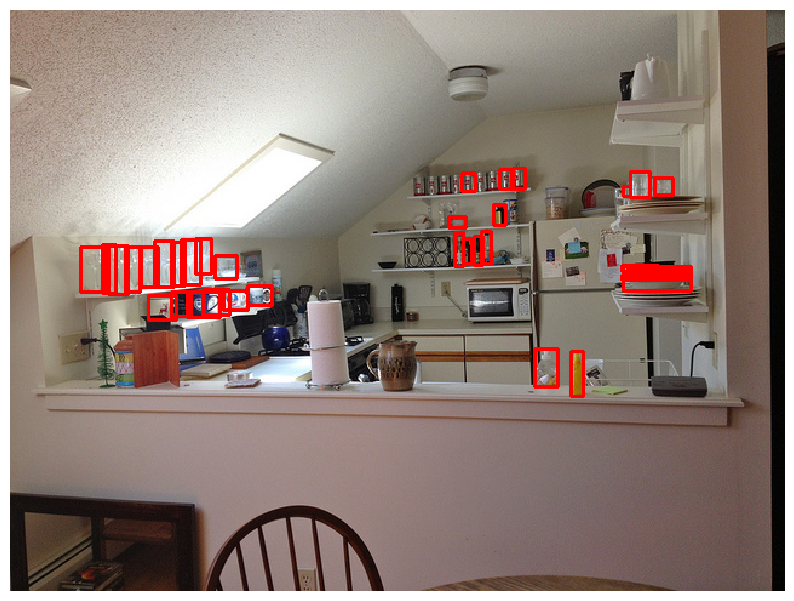

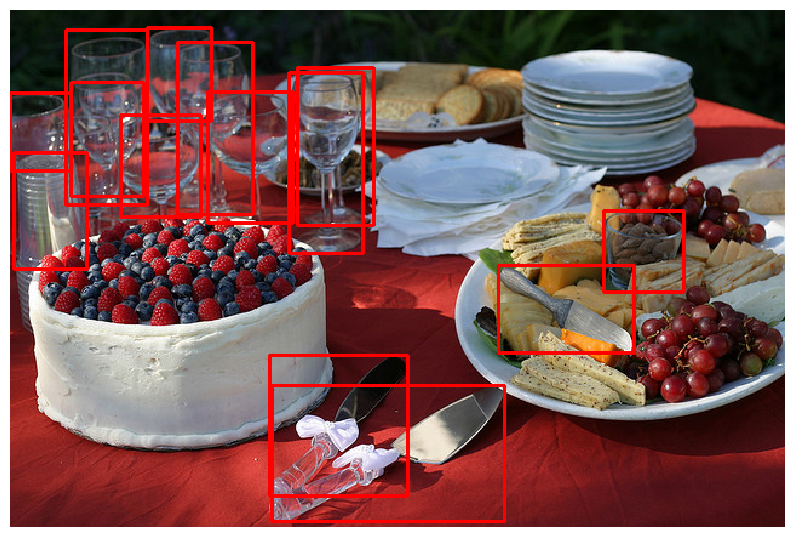

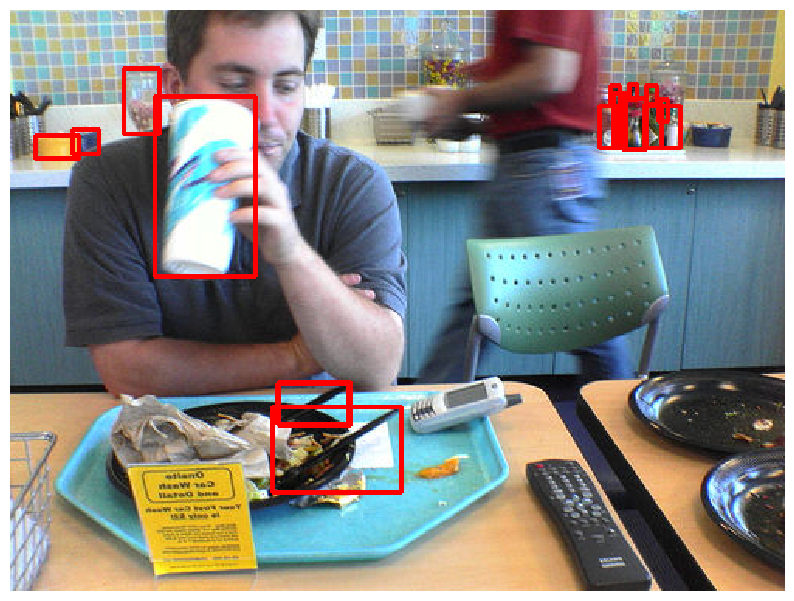

In [ ]:
# visualize GT boxes
class_to_idx = {"bottle":0, "wine glass":1, "cup":2, "fork":3, "knife":4,
                "spoon":5, "bowl":6}
idx_to_class = {i:c for c, i in class_to_idx.items()}
for i in range(len(img_list)):
  valid_box = sum([1 if j != -1 else 0 for j in box_list[i][:, 0]])
  data_visualizer(img_list[i], idx_to_class, box_list[i][:valid_box])

# RPN


In [ ]:
anchor_list = torch.tensor([[1, 1], [2, 2], [3, 3], [4, 4], [5, 5], [2, 3], [3, 2], [3, 5], [5, 3]], **to_float_cuda)
print(anchor_list.shape)

torch.Size([9, 2])


## Activated (positive) and negative anchors
When training the RPN, we compare the anchor boxes with the ground-truth boxes in order to determine a ground-truth label for the anchor boxes -- should each anchor predict object or background?

We assign a positive label to two kinds of anchors:

(i) the anchor/anchors with the highest Intersection-overUnion (IoU) overlap with a ground-truth box, or

(ii) an anchor that has an IoU overlap higher than 0.7 with any ground-truth box. Note that a single ground-truth box may assign positive labels to multiple anchors.

Usually the second condition is sufficient to determine the positive samples; but we still adopt the first condition for the reason that in some rare cases the second condition may find no positive sample.

We assign a negative label to a non-positive anchor if its IoU ratio is lower than 0.3 for all ground-truth boxes. Anchors that are neither positive nor negative do not contribute to the training objective

In [ ]:
#helper function
def IoU(proposals, bboxes):
  iou_mat = None
  B, A, H, W, _ = proposals.shape
  proposals = proposals.reshape(B, A*H*W, 4)
  tl = torch.max(proposals[:, :, :2].unsqueeze(2), bboxes[:, :, :2].unsqueeze(1))
  br = torch.min(proposals[:, :, 2:].unsqueeze(2), bboxes[:, :, 2:4].unsqueeze(1))
  intersect = torch.prod(br - tl, dim=3) * (tl < br).all(dim=3)
  a = torch.prod(bboxes[:, :, 2:4] - bboxes[:, :, :2], dim=2)
  b = torch.prod(proposals[:, :, 2:] - proposals[:, :, :2], dim=2)
  iou_mat = torch.div(intersect, a.unsqueeze(1) + b.unsqueeze(2) - intersect)

  return iou_mat



def GenerateGrid(batch_size, w_amap=7, h_amap=7, dtype=torch.float32, device='cuda'):
  """
  Return a grid cell given a batch size (center coordinates).

  Inputs:
  - batch_size, B
  - w_amap: or W', width of the activation map (number of grids in the horizontal dimension)
  - h_amap: or H', height of the activation map (number of grids in the vertical dimension)
  - W' and H' are always 7 in our case while w and h might vary.

  Outputs:
  grid: A float32 tensor of shape (B, H', W', 2) giving the (x, y) coordinates
        of the centers of each feature for a feature map of shape (B, D, H', W')
  """
  w_range = torch.arange(0, w_amap, dtype=dtype, device=device) + 0.5
  h_range = torch.arange(0, h_amap, dtype=dtype, device=device) + 0.5

  w_grid_idx = w_range.unsqueeze(0).repeat(h_amap, 1)
  h_grid_idx = h_range.unsqueeze(1).repeat(1, w_amap)
  grid = torch.stack([w_grid_idx, h_grid_idx], dim=-1)
  grid = grid.unsqueeze(0).repeat(batch_size, 1, 1, 1)

  return grid



def GenerateAnchor(anc, grid):
    anchors = None
    B, H, W, _ = grid.shape
    A, _ = anc.shape
    anchors = torch.zeros((B, A, H, W, 4), device = grid.device, dtype = grid.dtype)
    for a in range(A):
      anchors[:,a,:,:,0] = grid[:,:,:,0] - anc[a,0]/2
      anchors[:,a,:,:,1] = grid[:,:,:,1] - anc[a,1]/2
      anchors[:,a,:,:,2] = grid[:,:,:,0] + anc[a,0]/2
      anchors[:,a,:,:,3] = grid[:,:,:,1] + anc[a,1]/2

    return anchors


def ReferenceOnActivatedAnchors(anchors, bboxes, grid, iou_mat, pos_thresh=0.7, neg_thresh=0.3):
    B, A, h_amap, w_amap, _ = anchors.shape
    N = bboxes.shape[1]

    # activated/positive anchors
    max_iou_per_anc, max_iou_per_anc_ind = iou_mat.max(dim=-1)
    max_iou_per_box = iou_mat.max(dim=1, keepdim=True)[0]
    activated_anc_mask = (iou_mat == max_iou_per_box) & (max_iou_per_box > 0)
    activated_anc_mask |= (iou_mat > pos_thresh) # using the pos_thresh condition as well
    # if an anchor matches multiple GT boxes, choose the box with the largest iou
    activated_anc_mask = activated_anc_mask.max(dim=-1)[0] # Bx(AxH’xW’)
    activated_anc_ind = torch.nonzero(activated_anc_mask.view(-1)).squeeze(-1)

    # GT conf scores
    GT_conf_scores = max_iou_per_anc[activated_anc_mask] # M

    # # GT class
    # box_cls = bboxes[:, :, 4].view(B, 1, N).expand((B, A*h_amap*w_amap, N))
    # GT_class = torch.gather(box_cls, -1, max_iou_per_anc_ind.unsqueeze(-1)).squeeze(-1) # M
    # GT_class = GT_class[activated_anc_mask].long()

    bboxes_expand = bboxes[:, :, :4].view(B, 1, N, 4).expand((B, A*h_amap*w_amap, N, 4))
    bboxes = torch.gather(bboxes_expand, -2, max_iou_per_anc_ind.unsqueeze(-1) \
      .unsqueeze(-1).expand(B, A*h_amap*w_amap, 1, 4)).view(-1, 4)
    bboxes = bboxes[activated_anc_ind]

    print('number of pos proposals: ', activated_anc_ind.shape[0])
    activated_anc_coord = anchors.view(-1, 4)[activated_anc_ind]

    # GT offsets
    # bbox and anchor coordinates are x_tl, y_tl, x_br, y_br
    # offsets are t_x, t_y, t_w, t_h
    wh_offsets = torch.log((bboxes[:, 2:4] - bboxes[:, :2]) \
      / (activated_anc_coord[:, 2:4] - activated_anc_coord[:, :2]))

    xy_offsets = (bboxes[:, :2] + bboxes[:, 2:4] - \
      activated_anc_coord[:, :2] - activated_anc_coord[:, 2:4]) / 2.

    xy_offsets /= (activated_anc_coord[:, 2:4] - activated_anc_coord[:, :2])

    GT_offsets = torch.cat((xy_offsets, wh_offsets), dim=-1)

    # negative anchors
    negative_anc_mask = (max_iou_per_anc < neg_thresh) # Bx(AxH’xW’)
    negative_anc_ind = torch.nonzero(negative_anc_mask.view(-1)).squeeze(-1)
    negative_anc_ind = negative_anc_ind[torch.randint(0, negative_anc_ind.shape[0], (activated_anc_ind.shape[0],))]
    negative_anc_coord = anchors.view(-1, 4)[negative_anc_ind.view(-1)]

    # activated_anc_coord and negative_anc_coord are mainly for visualization purposes
    return activated_anc_ind, negative_anc_ind, GT_conf_scores, GT_offsets, \
          activated_anc_coord, negative_anc_coord

In [ ]:
# def GenerateGrid(batch_size, w_amap=7, h_amap=7, dtype=torch.float32, device='cuda'):
#     w_range = torch.arange(0, w_amap*40,40, dtype=dtype, device=device) + 0.5
#     h_range = torch.arange(0, h_amap*40,40, dtype=dtype, device=device) + 0.5

#     w_grid_idx = w_range.unsqueeze(0).repeat(h_amap, 1)
#     h_grid_idx = h_range.unsqueeze(1).repeat(1, w_amap)
#     grid = torch.stack([w_grid_idx, h_grid_idx], dim=-1)
#     grid = grid.unsqueeze(0).repeat(batch_size, 1, 1, 1)
#     return grid
# grid_list = GenerateGrid(w_list.shape[0])

# center = torch.cat((grid_list, grid_list), dim=-1)
# grid_cell = center.clone()
# grid_cell[:, :, :, [0, 1]] -= 1/2
# grid_cell[:, :, :, [2,3]] += 1/2
# center = coord_trans(center, w_list, h_list)
# grid_cell = coord_trans(grid_cell, w_list, h_list)

# # for img, anc, grid in zip(img_list, center, grid_cell):

#   # data_visualizer(img, idx_to_class, anc.reshape(-1, 4), grid.reshape(-1, 4))

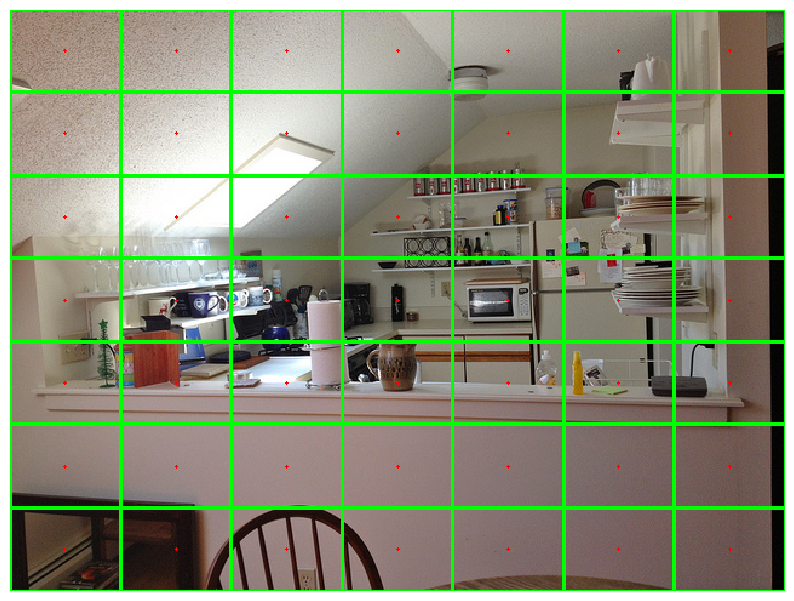

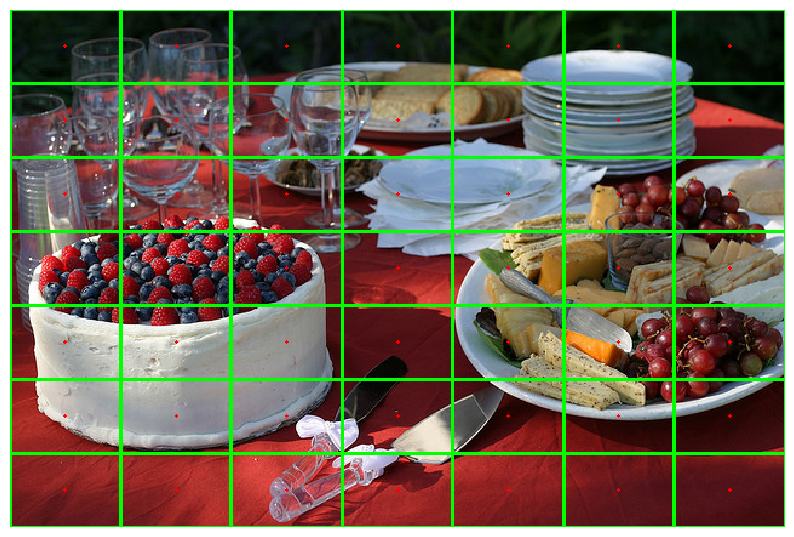

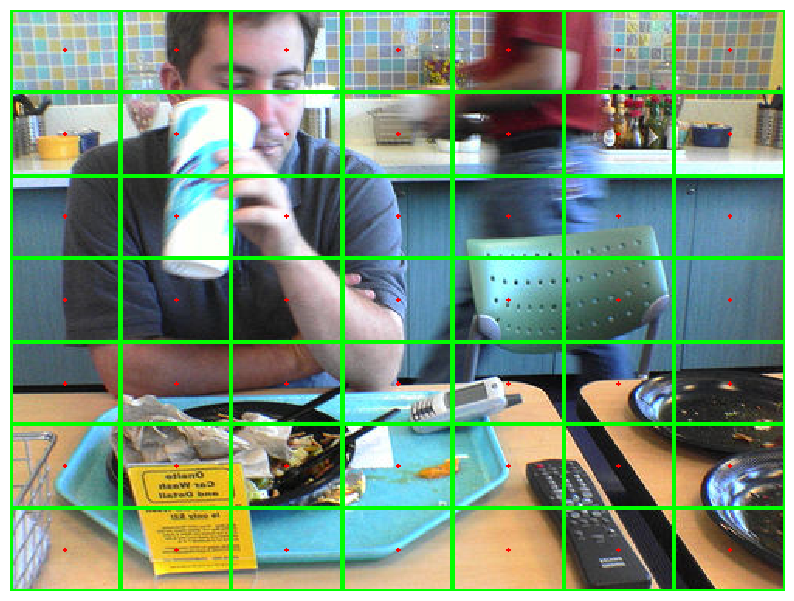

In [ ]:
# visualization
# simply create an activation grid where the cells are in green and the centers in red
# you should see the entire image divided by a 7x7 grid, with no gaps on the edges

grid_list = GenerateGrid(w_list.shape[0])

center = torch.cat((grid_list, grid_list), dim=-1)
grid_cell = center.clone()
grid_cell[:, :, :, [0, 1]] -= 1. / 2.
grid_cell[:, :, :, [2, 3]] += 1. / 2.
center = coord_trans(center, w_list, h_list)
grid_cell = coord_trans(grid_cell, w_list, h_list)

for img, anc, grid in zip(img_list, center, grid_cell):
  data_visualizer(img, idx_to_class, anc.reshape(-1, 4), grid.reshape(-1, 4))

In [ ]:
fix_random_seed(0)

grid_list = GenerateGrid(w_list.shape[0])
anc_list = GenerateAnchor(anchor_list, grid_list)
iou_mat = IoU(anc_list, resized_box_list)
activated_anc_ind, negative_anc_ind, GT_conf_scores, GT_offsets, \
  activated_anc_coord, negative_anc_coord = ReferenceOnActivatedAnchors(anc_list, resized_box_list, grid_list, iou_mat)
# print(activated_anc_ind)
# print(negative_anc_ind)
# print(GT_conf_scores)
# print(GT_offsets)
# print(activated_anc_coord)
# print(negative_anc_coord)
# expected_GT_conf_scores = torch.tensor([0.74538743, 0.72793430, 0.71128041, 0.70029843,
#                                         0.75670898, 0.76044953, 0.37116671, 0.37116671], **to_float_cuda)
# expected_GT_offsets = torch.tensor([[ 0.01633334,  0.11911901, -0.09431065,  0.19244696],
#                                     [-0.03675002,  0.09324861, -0.00250307,  0.25213102],
#                                     [-0.03675002, -0.15675139, -0.00250307,  0.25213102],
#                                     [-0.02940002,  0.07459889, -0.22564663,  0.02898745],
#                                     [ 0.11879997,  0.03208542,  0.20863886, -0.07974572],
#                                     [-0.08120003,  0.03208542,  0.20863886, -0.07974572],
#                                     [ 0.07699990,  0.28533328, -0.03459148, -0.86750042],
#                                     [ 0.07699990, -0.21466672, -0.03459148, -0.86750042]], **to_float_cuda)
# expected_GT_class = torch.tensor([ 6,  7,  7,  7, 19, 19,  6,  6], **to_long_cuda)

number of pos proposals:  32


********************************************************************************
Activated (positive) anchors:
9 activated anchors!


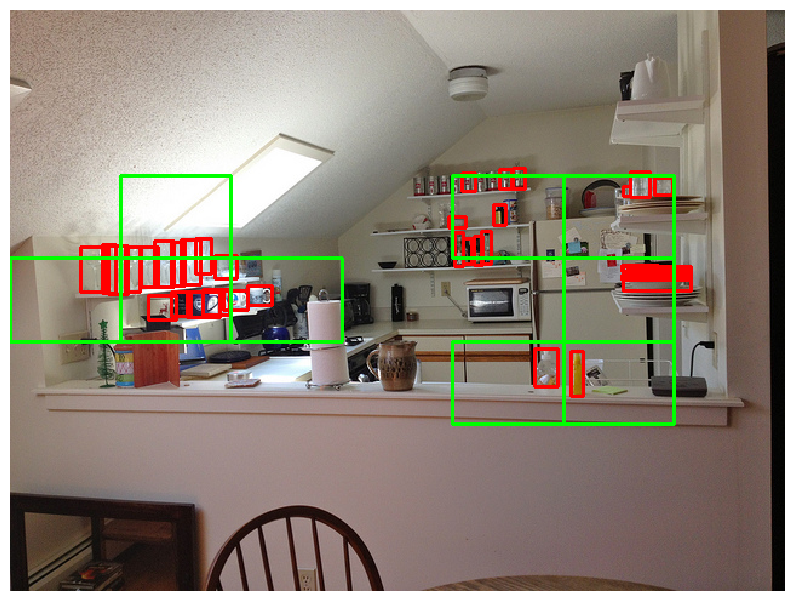

16 activated anchors!


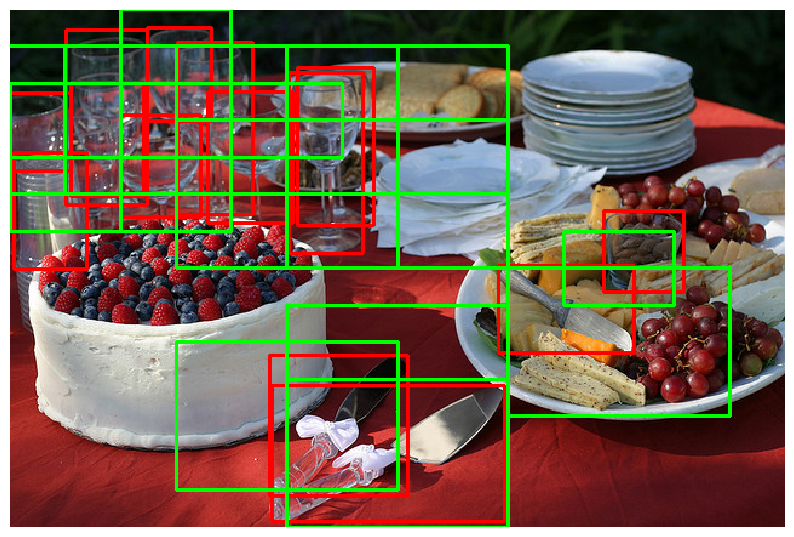

7 activated anchors!


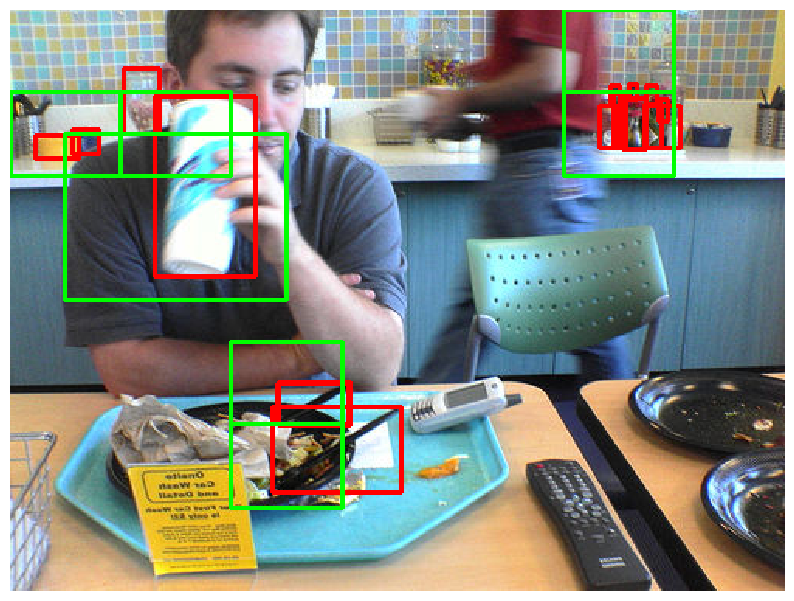

********************************************************************************
Negative anchors:
8 negative anchors!


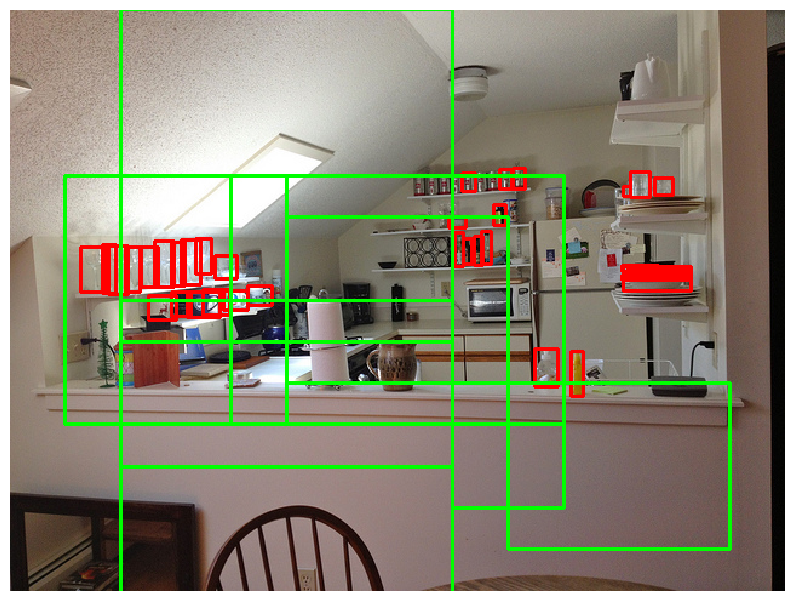

5 negative anchors!


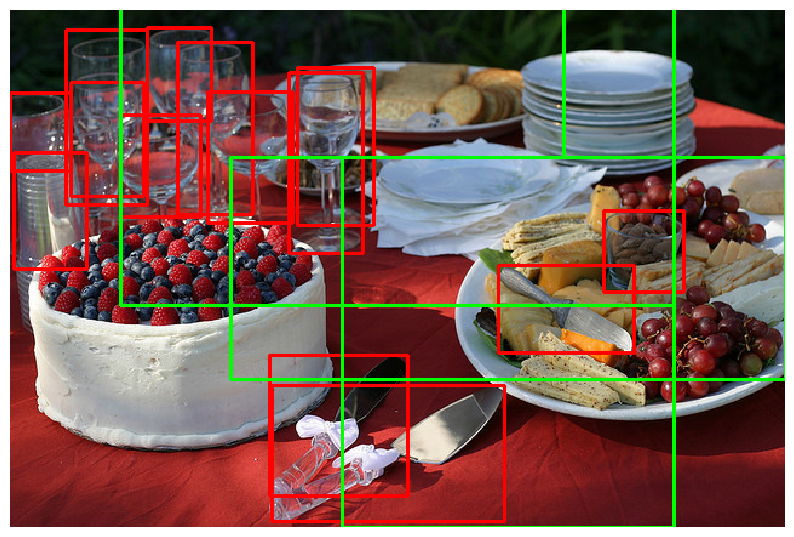

19 negative anchors!


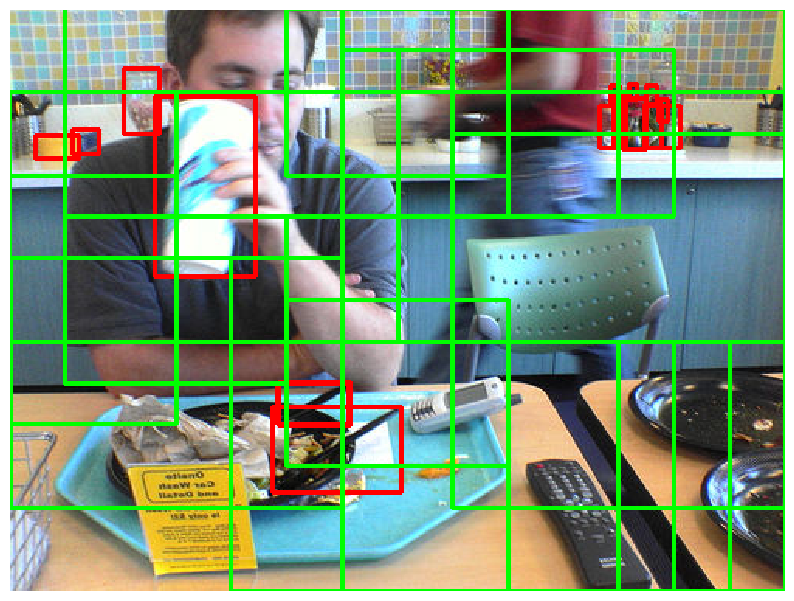

In [ ]:
# visualize the activated anchors
anc_per_img = torch.prod(torch.tensor(anc_list.shape[1:-1]))

print('*'*80)
print('Activated (positive) anchors:')
for img, bbox, idx in zip(img_list, box_list, torch.arange(box_list.shape[0])):
  anc_ind_in_img = (activated_anc_ind >= idx * anc_per_img) & (activated_anc_ind < (idx+1) * anc_per_img)
  print('{} activated anchors!'.format(torch.sum(anc_ind_in_img)))
  data_visualizer(img, idx_to_class, bbox[:, :4], coord_trans(activated_anc_coord[anc_ind_in_img], w_list[idx], h_list[idx]))

print('*'*80)
print('Negative anchors:')
for img, bbox, idx in zip(img_list, box_list, torch.arange(box_list.shape[0])):
  anc_ind_in_img = (negative_anc_ind >= idx * anc_per_img) & (negative_anc_ind < (idx+1) * anc_per_img)
  print('{} negative anchors!'.format(torch.sum(anc_ind_in_img)))
  data_visualizer(img, idx_to_class, bbox[:, :4], coord_trans(negative_anc_coord[anc_ind_in_img], w_list[idx], h_list[idx]))

In [ ]:
# sanity check
anc_list = GenerateAnchor(anchor_list, grid_list)
assert anc_list.shape == torch.Size([3, 9, 7, 7, 4]), 'shape mismatch!'

expected_anc_list_mean = torch.tensor([[-1.25000000, -0.87500000,  2.25000000,  1.87500000],
                                       [ 1.75000000, -0.87500000,  5.25000000,  1.87500000],
                                       [ 4.75000000, -0.87500000,  8.25000000,  1.87500000],
                                       [-1.25000000,  1.12500000,  2.25000000,  3.87500000],
                                       [ 1.75000000,  1.12500000,  5.25000000,  3.87500000],
                                       [ 4.75000000,  1.12500000,  8.25000000,  3.87500000],
                                       [-1.25000000,  3.12500000,  2.25000000,  5.87500000],
                                       [ 1.75000000,  3.12500000,  5.25000000,  5.87500000],
                                       [ 4.75000000,  3.12500000,  8.25000000,  5.87500000],
                                       [-1.25000000,  5.12500000,  2.25000000,  7.87500000],
                                       [ 1.75000000,  5.12500000,  5.25000000,  7.87500000],
                                       [ 4.75000000,  5.12500000,  8.25000000,  7.87500000]], **to_float_cuda)
print('rel error: ', rel_error(expected_anc_list_mean, anc_list[0, [1,3,6,8], ::2, ::3, :].view(-1, 12, 4).mean(0)))

rel error:  0.0


********************************************************************************
All nine anchors should be exactly centered:
torch.Size([9, 1, 1, 4])


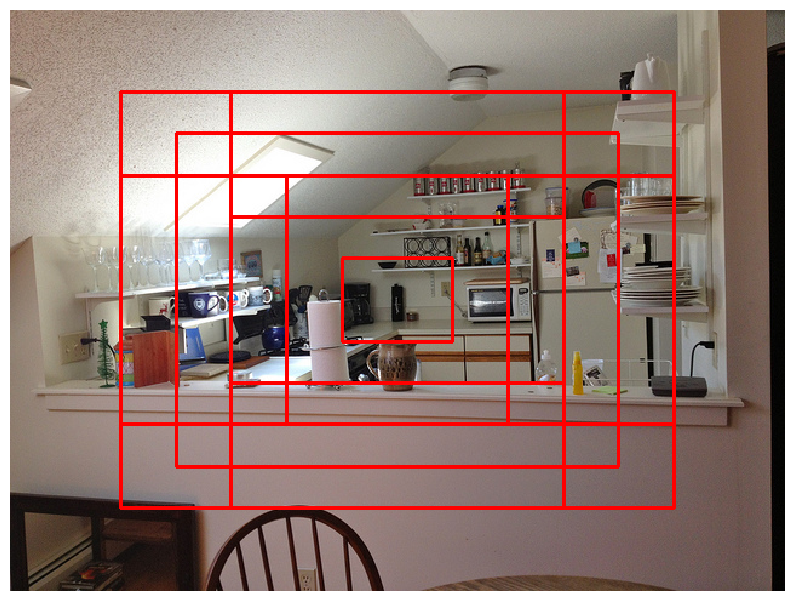

torch.Size([9, 1, 1, 4])


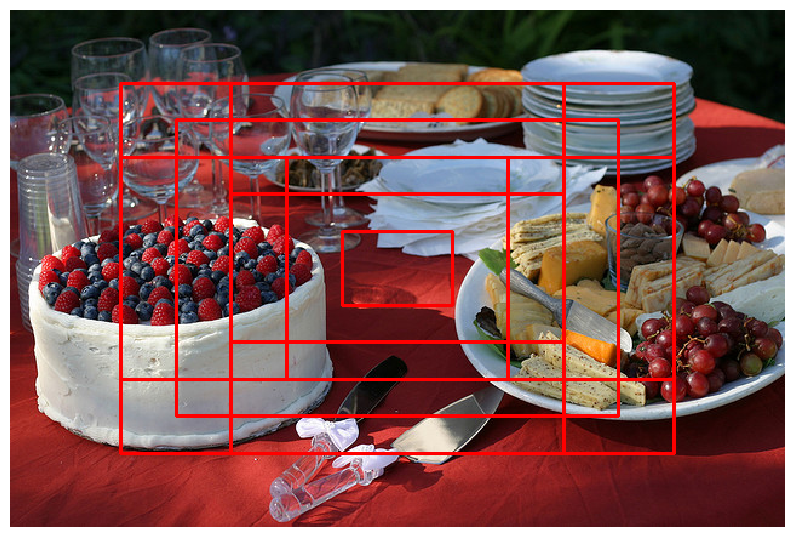

torch.Size([9, 1, 1, 4])


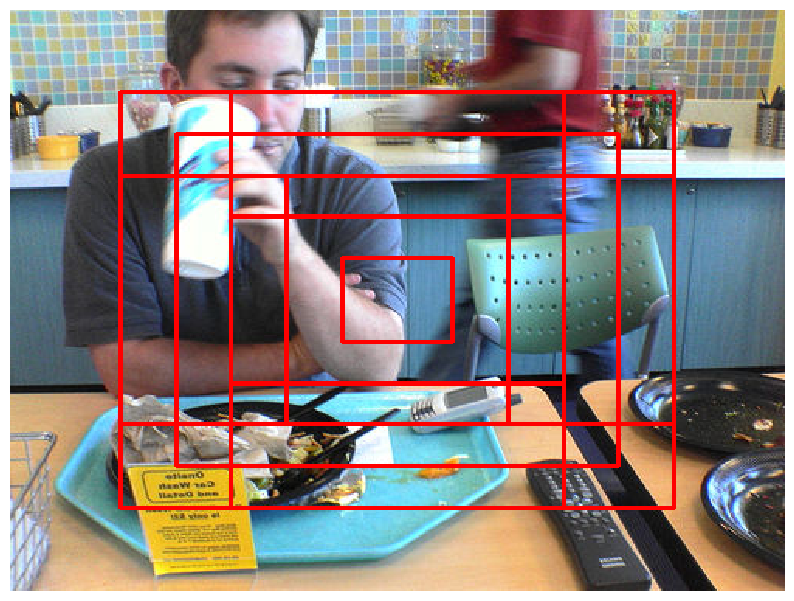

********************************************************************************
All anchors of the image (cluttered):
torch.Size([9, 7, 7, 4])


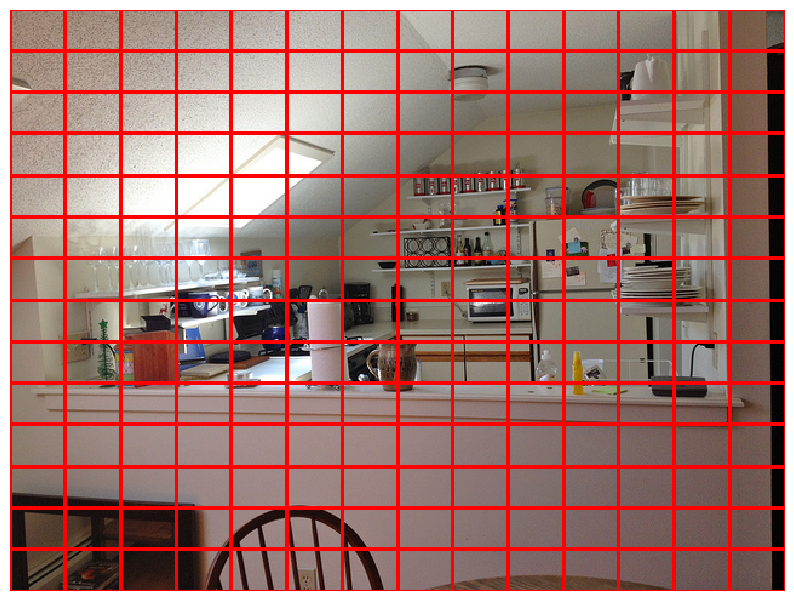

torch.Size([9, 7, 7, 4])


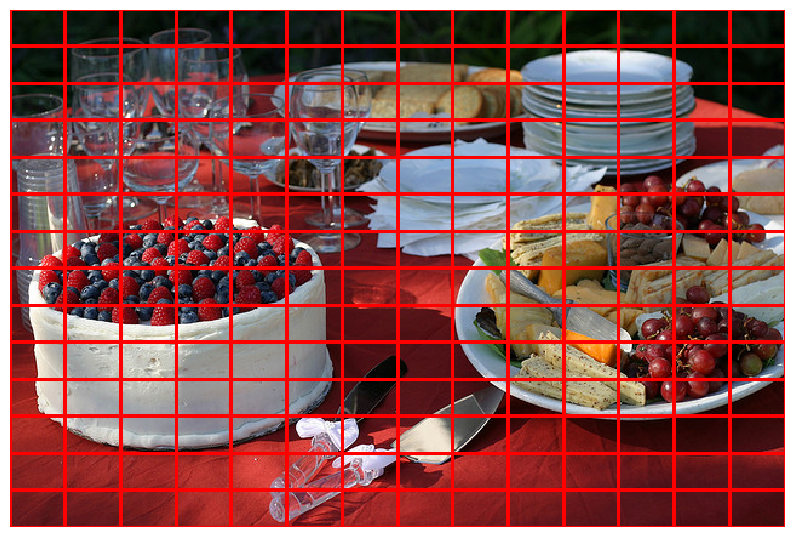

torch.Size([9, 7, 7, 4])


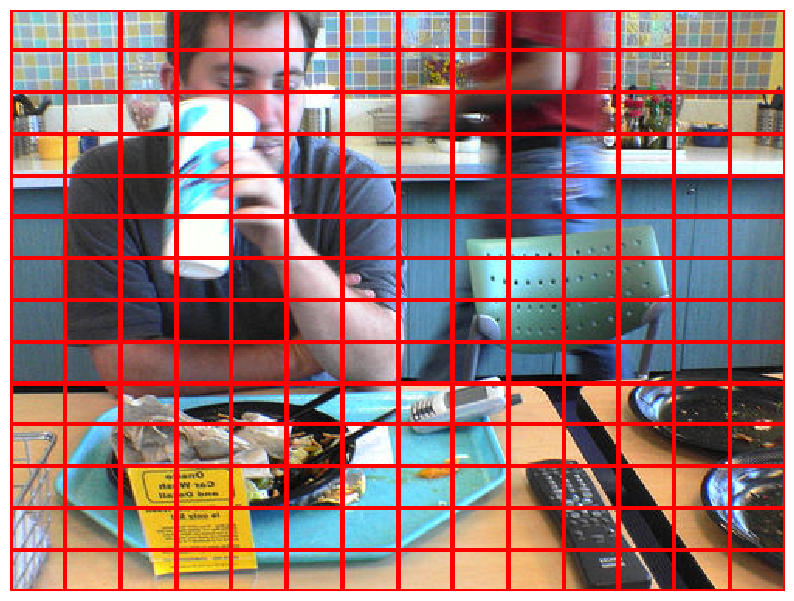

In [ ]:
# visualization
print('*'*80)
print('All nine anchors should be exactly centered:')
anc_list = GenerateAnchor(anchor_list, grid_list[:, 3:4, 3:4])
for img, anc in zip(img_list, coord_trans(anc_list, w_list, h_list)):
  print(anc.shape)
  data_visualizer(img, idx_to_class, anc.reshape(-1, 4))

print('*'*80)
print('All anchors of the image (cluttered):')
anc_list = GenerateAnchor(anchor_list, grid_list) # all
for img, anc in zip(img_list, coord_trans(anc_list, w_list, h_list)):
  print(anc.shape)
  data_visualizer(img, idx_to_class, anc.reshape(-1, 4))

In [ ]:
def GenerateProposal(anchors, offsets):
  """
  Proposal generator.

  Inputs:
  - anchors: Anchor boxes, of shape (B, A, H', W', 4). Anchors are represented
    by the coordinates of their top-left and bottom-right corners.
  - offsets: Transformations of shape (B, A, H', W', 4) that will be used to
    convert anchor boxes into region proposals. The transformation
    offsets[b, a, h, w] = (tx, ty, tw, th) will be applied to the anchor
    anchors[b, a, h, w]. For YOLO, assume that tx and ty are in the range
    (-0.5, 0.5).
  - method: Which transformation formula to use, either 'YOLO' or 'FasterRCNN'

  Outputs:
  - proposals: Region proposals of shape (B, A, H', W', 4), represented by the
    coordinates of their top-left and bottom-right corners. Applying the
    transform offsets[b, a, h, w] to the anchor [b, a, h, w] should give the
    proposal proposals[b, a, h, w].

  """
  proposals = torch.zeros_like(anchors)
  anc_trans = torch.zeros_like(anchors)
  anc_trans[:, :, :, :, 2:] = (anchors[:, :, :, :, 2:] - anchors[:, :, :, :, :2]) # w, h = br - tl
  anc_trans[:, :, :, :, :2] = (anchors[:, :, :, :, 2:] + anchors[:, :, :, :, :2]) / 2 # (br + tl) / 2
  new_anc_trans = anc_trans.clone() # avoid inplace operation
  new_anc_trans[:, :, :, :, :2] = anc_trans[:, :, :, :, :2] + offsets[:, :, :, :, :2] * anc_trans[:, :, :, :, 2:]
  new_anc_trans[:, :, :, :, 2:] = torch.mul(anc_trans[:, :, :, :, 2:], torch.exp(offsets[:, :, :, :, 2:]))

  # tansform back
  proposals[:, :, :, :, :2] =  new_anc_trans[:, :, :, :, :2] - (new_anc_trans[:, :, :, :, 2:] / 2)
  proposals[:, :, :, :, 2:] =  new_anc_trans[:, :, :, :, :2] + (new_anc_trans[:, :, :, :, 2:] / 2)
  # print("From 1")
  return proposals

OFFSET SANITY CHECK

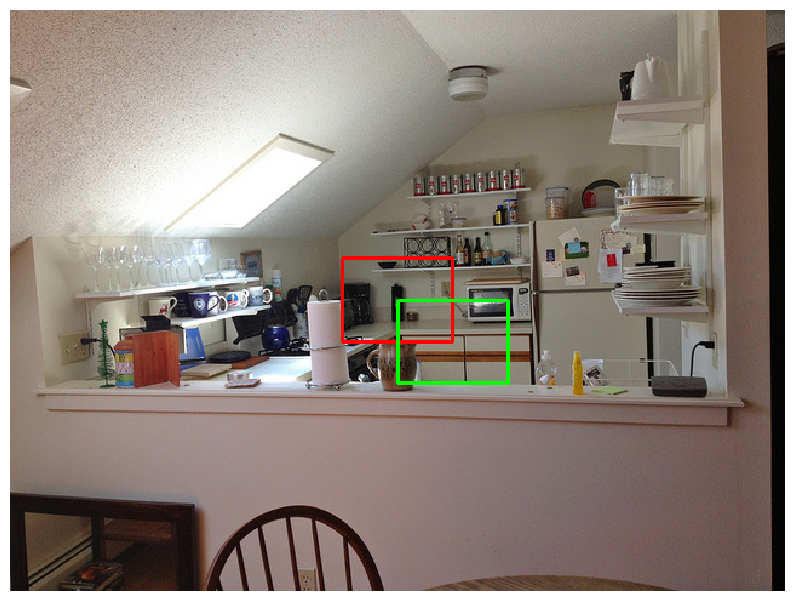

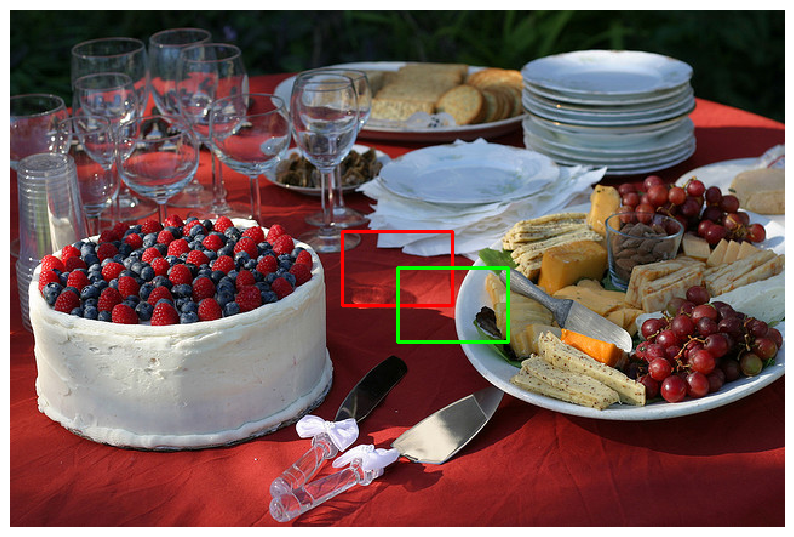

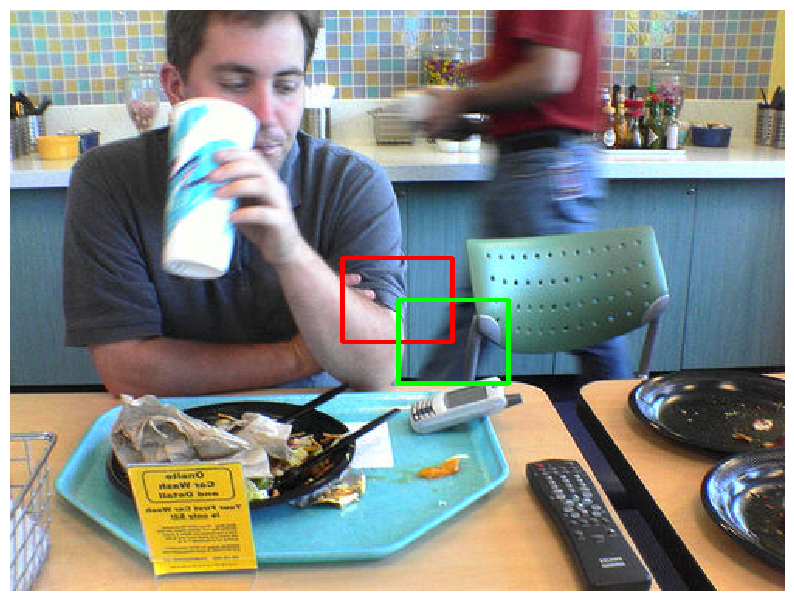

In [ ]:
offset_list = torch.cat([torch.ones_like(anc_list[:, :, :, :, 0:2]).fill_(.5), torch.zeros_like(anc_list[:, :, :, :, 2:4])], dim=-1)
proposal_list = GenerateProposal(anc_list, offset_list)

for img, anc, prop in zip(img_list, coord_trans(anc_list[:, 0:1, 3:4, 3:4, :], w_list, h_list), \
                          coord_trans(proposal_list[:, 0:1, 3:4, 3:4, :], w_list, h_list)):
  data_visualizer(img, idx_to_class, anc.reshape(-1, 4), prop.reshape(-1, 4))

SCALE UP SANITY CHECK

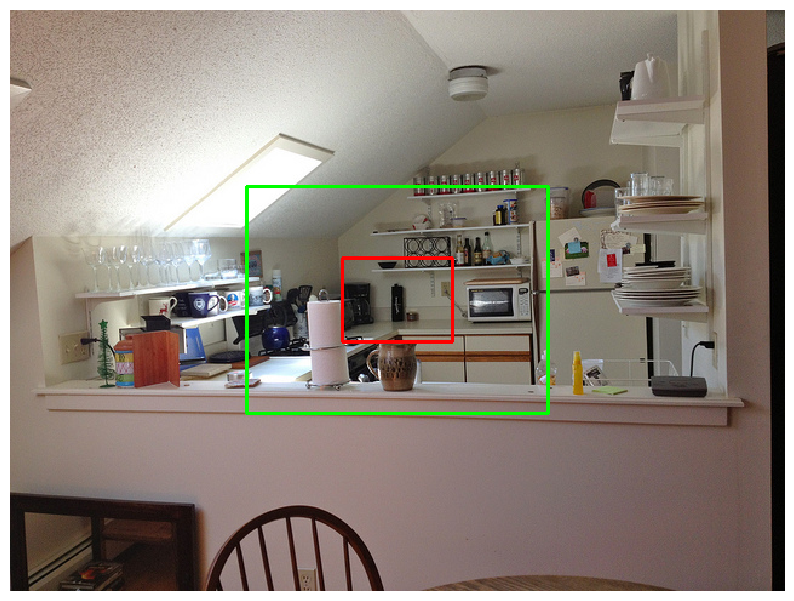

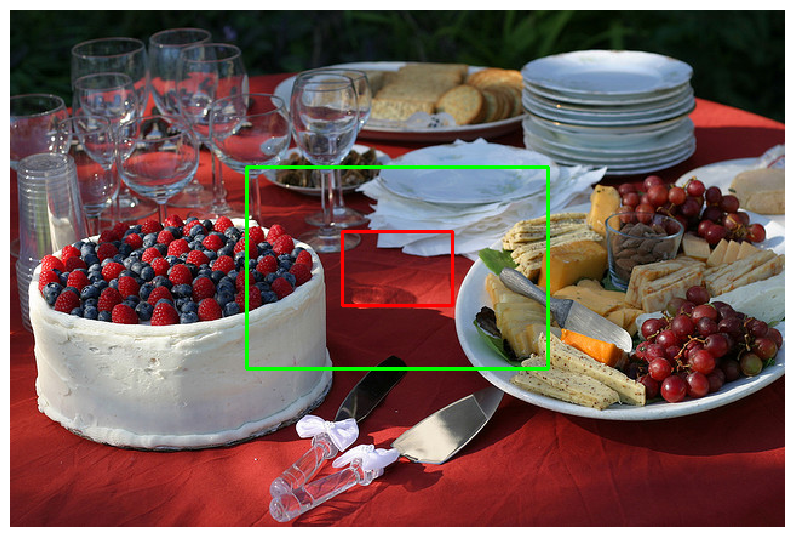

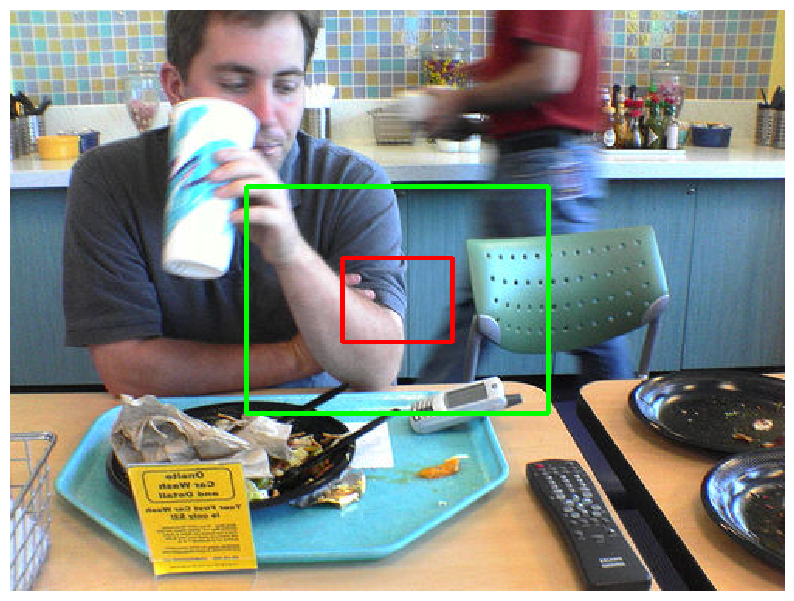

In [ ]:
offset_list = torch.cat([torch.zeros_like(anc_list[:, :, :, :, 0:2]), torch.ones_like(anc_list[:, :, :, :, 2:4]).fill_(1.)], dim=-1)
proposal_list = GenerateProposal(anc_list, offset_list)

for img, anc, prop in zip(img_list, coord_trans(anc_list[:, 0:1, 3:4, 3:4, :], w_list, h_list), \
                          coord_trans(proposal_list[:, 0:1, 3:4, 3:4, :], w_list, h_list)):
  data_visualizer(img, idx_to_class, anc.reshape(-1, 4), prop.reshape(-1, 4))

### TRAINING RPN

In [ ]:
import torch.nn as nn
class ProposalModule(nn.Module):
  def __init__(self, in_dim, hidden_dim=256, num_anchors=9, drop_ratio=0.3):
    super().__init__()

    assert(num_anchors != 0)
    self.num_anchors = num_anchors
    ##############################################################################
    # Here we define the region proposal layer - a sequential module with a 3x3    #
    # conv layer, followed by a Dropout (p=drop_ratio), a Leaky ReLU and         #
    # a 1x1 conv.                                                                #
    # The output should be of shape Bx(Ax6)x7x7, where A=self.num_anchors. #
    #       Determine the padding of the 3x3 conv layer given the output dim.    #
    ##############################################################################

    self.predictHead = nn.Sequential(
          nn.Conv2d(in_dim,hidden_dim,3,padding=1),
          nn.Dropout(drop_ratio),
          nn.LeakyReLU(),
          nn.Conv2d(hidden_dim,6*self.num_anchors,1)
        )

  def _extract_anchor_data(self, anchor_data, anchor_idx):
    """
    Inputs:
    - anchor_data: Tensor of shape (B, A, D, H, W) giving a vector of length
      D for each of A anchors at each point in an H x W grid.
    - anchor_idx: int64 Tensor of shape (M,) giving anchor indices to extract

    Returns:
    - extracted_anchors: Tensor of shape (M, D) giving anchor data for each
      of the anchors specified by anchor_idx.
    """
    B, A, D, H, W = anchor_data.shape
    anchor_data = anchor_data.permute(0, 1, 3, 4, 2).contiguous().view(-1, D)
    extracted_anchors = anchor_data[anchor_idx]
    return extracted_anchors

  def forward(self, features, pos_anchor_coord=None, \
              pos_anchor_idx=None, neg_anchor_idx=None):
    """
    Run the forward pass of the proposal module.

    Inputs:
    - features: Tensor of shape (B, in_dim, H', W') giving features from the
      backbone network.
    - pos_anchor_coord: Tensor of shape (M, 4) giving the coordinates of
      positive anchors. Anchors are specified as (x_tl, y_tl, x_br, y_br) with
      the coordinates of the top-left corner (x_tl, y_tl) and bottom-right
      corner (x_br, y_br). During inference this is None.
    - pos_anchor_idx: int64 Tensor of shape (M,) giving the indices of positive
      anchors. During inference this is None.
    - neg_anchor_idx: int64 Tensor of shape (M,) giving the indicdes of negative
      anchors. During inference this is None.

    The outputs from this module are different during training and inference.

    During training, pos_anchor_coord, pos_anchor_idx, and neg_anchor_idx are
    all provided, and we only output predictions for the positive and negative
    anchors. During inference, these are all None and we must output predictions
    for all anchors.

    Outputs (during training):
    - conf_scores: Tensor of shape (2M, 2) giving the classification scores
      (object vs background) for each of the M positive and M negative anchors.
    - offsets: Tensor of shape (M, 4) giving predicted transforms for the
      M positive anchors.If a single Tensor is passed, then the first column should contain the batch index.
    - proposals: Tensor of shaIf a single Tensor is passed, then the first column should contain the batch index.pe (M, 4) giving predicted region proposals for
      the M positive anchors.If a single Tensor is passed, then the first column should contain the batch index.

    Outputs (during inference):
    - conf_scores: Tensor of shape (B, A, 2, H', W') giving the predicted
      classification scores (object vs background) for all anchors
    - offsets: Tensor of shape (B, A, 4, H', W') giving the predicted transforms
      for all anchors
    """
    if pos_anchor_coord is None or pos_anchor_idx is None or neg_anchor_idx is None:
      mode = 'eval'
    else:
      mode = 'train'
    conf_scores, offsets, proposals = None, None, None

    # Here we Predict classification scores (object vs background) and transforms#
    # for all anchors. During inference, simply output predictions for all     #
    # anchors. During training, extract the predictions for only the positive  #
    # and negative anchors as described above, and also apply the transforms to#
    # the positive anchors to compute the coordinates of the region proposals. #

    anchor_features=self.predictHead(features) #Bx(Ax6)x7x7
    # split features into conf_package and offsets_package
    B,_,H,W = anchor_features.shape
    anchor_features = anchor_features.reshape(B,self.num_anchors,6,H,W)
    conf_package = anchor_features[:,:,:2,:,:]
    offsets_package = anchor_features[:,:,2:,:,:]
    if mode == 'eval':
      conf_scores, offsets = conf_package, offsets_package
    else:
      # train mode
      extracted_conf_package_pos = self._extract_anchor_data(conf_package,pos_anchor_idx)
      extracted_conf_package_neg = self._extract_anchor_data(conf_package,neg_anchor_idx)
      conf_scores = torch.cat((extracted_conf_package_pos,extracted_conf_package_neg), dim=0)[:,0:2]

      offsets = self._extract_anchor_data(offsets_package,pos_anchor_idx)

      M,_=pos_anchor_coord.shape

      proposals = GenerateProposal(pos_anchor_coord.reshape(1,1,1,M,4),
                                   offsets.reshape(1,1,1,M,4)).reshape(M,4)

    if mode == 'train':
      return conf_scores, offsets, proposals
    elif mode == 'eval':
      return conf_scores, offsets

In [ ]:
# sanity check
fix_random_seed(0)
prop_module = ProposalModule(1280, drop_ratio=0).to(**to_float_cuda)
features = torch.linspace(-10., 10., steps=3*1280*7*7, **to_float_cuda).view(3, 1280, 7, 7)
conf_scores, offsets, proposals = prop_module(features, activated_anc_coord, \
              pos_anchor_idx=activated_anc_ind, neg_anchor_idx=negative_anc_ind)

expected_conf_scores = torch.tensor([[-0.50843990,  2.62025023],
                                     [-0.55775326, -0.29983672],
                                     [-0.55796617, -0.30000290],
                                     [ 0.17819080, -0.42211828],
                                     [-0.51439995, -0.47708601],
                                     [-0.51439744, -0.47703803],
                                     [ 0.63225138,  2.71269488],
                                     [ 0.63224381,  2.71290708]], **to_float_cuda)
# expected_offsets = torch.tensor([[ 1.62754285,  1.35253453, -1.85451591, -1.77882397],
#                                  [-0.33651856, -0.14402901, -0.07458937, -0.27201492],
#                                  [-0.33671042, -0.14398587, -0.07479107, -0.27199429],
#                                  [ 0.06847382,  0.21062726,  0.09334904, -0.02446130],
#                                  [ 0.16506940, -0.30296192,  0.29626080,  0.32173073],
#                                  [ 0.16507357, -0.30302414,  0.29625297,  0.32169008],
#                                  [ 1.59992146, -0.75236654,  1.66449440,  2.05138564],
#                                  [ 1.60008609, -0.75249159,  1.66474164,  2.05162382]], **to_float_cuda)

print('conf scores error: ', rel_error(conf_scores[:8], expected_conf_scores))
# print('offsets error: ', rel_error(offsets, expected_offsets))

conf scores error:  tensor(1.3958, device='cuda:0', grad_fn=<MaxBackward1>)


###Loss Function

In [ ]:
import torch.nn.functional as F

def ConfScoreRegression(conf_scores, batch_size):
  """
  Binary cross-entropy loss

  Inputs:
  - conf_scores: Predicted confidence scores, of shape (2M, 2). Assume that the
    first M are positive samples, and the last M are negative samples.

  Outputs:
  - conf_score_loss: Torch scalar
  """
  # the target conf_scores for positive samples are ones and negative are zeros
  M = conf_scores.shape[0] // 2
  GT_conf_scores = torch.zeros_like(conf_scores)
  GT_conf_scores[:M, 0] = 1.
  GT_conf_scores[M:, 1] = 1.

  conf_score_loss = F.binary_cross_entropy_with_logits(conf_scores, GT_conf_scores, \
                                     reduction='sum') * 1. / batch_size
  return conf_score_loss
def BboxRegression(offsets, GT_offsets, batch_size):
  """"
  Use SmoothL1 loss as in Faster R-CNN

  Inputs:
  - offsets: Predicted box offsets, of shape (M, 4)
  - GT_offsets: GT box offsets, of shape (M, 4)

  Outputs:
  - bbox_reg_loss: Torch scalar
  """
  bbox_reg_loss = F.smooth_l1_loss(offsets, GT_offsets, reduction='sum') * 1. / batch_size
  return bbox_reg_loss

In [ ]:
conf_loss = ConfScoreRegression(conf_scores, features.shape[0])
reg_loss = BboxRegression(offsets, GT_offsets, features.shape[0])
print('conf loss: {:.4f}, reg loss: {:.4f}'.format(conf_loss, reg_loss))

loss_all = torch.tensor([conf_loss.data, reg_loss.data], **to_float_cuda)
expected_loss = torch.tensor([8.55673981, 5.10593748], **to_float_cuda)

print('loss error: ', rel_error(loss_all, expected_loss))

conf loss: 43.7740, reg loss: 18.6777
loss error:  tensor(0.8045, device='cuda:0')


In [ ]:
class FeatureExtractor(nn.Module):
  """
  Image feature extraction with MobileNet.
  """
  def __init__(self, reshape_size=224, pooling=False, verbose=False):
    super().__init__()

    from torchvision import models
    from torchsummary import summary

    self.mobilenet = models.mobilenet_v2(pretrained=True)
    self.mobilenet = nn.Sequential(*list(self.mobilenet.children())[:-1]) # Remove the last classifier

    # average pooling
    if pooling:
      self.mobilenet.add_module('LastAvgPool', nn.AvgPool2d(math.ceil(reshape_size/32.))) # input: N x 1280 x 7 x 7

    for i in self.mobilenet.named_parameters():
      i[1].requires_grad = True # fine-tune all

    if verbose:
      summary(self.mobilenet.cuda(), (3, reshape_size, reshape_size))

  def forward(self, img, verbose=False):
    """
    Inputs:
    - img: Batch of resized images, of shape Nx3x224x224

    Outputs:
    - feat: Image feature, of shape Nx1280 (pooled) or Nx1280x7x7
    """
    num_img = img.shape[0]

    img_prepro = img

    feat = []
    process_batch = 500
    for b in range(math.ceil(num_img/process_batch)):
      feat.append(self.mobilenet(img_prepro[b*process_batch:(b+1)*process_batch]
                              ).squeeze(-1).squeeze(-1)) # forward and squeeze
    feat = torch.cat(feat)

    if verbose:
      print('Output feature shape: ', feat.shape)

    return feat

In [ ]:
class RPN(nn.Module):
  def __init__(self):
    super().__init__()

    # READ ONLY
    self.anchor_list = torch.tensor([[1, 1], [2, 2], [3, 3], [4, 4], [5, 5], [2, 3], [3, 2], [3, 5], [5, 3]])
    self.feat_extractor = FeatureExtractor()
    self.prop_module = ProposalModule(1280, num_anchors=self.anchor_list.shape[0])

  def forward(self, images, bboxes, output_mode='loss'):
    """
    Training-time forward pass for the Region Proposal Network.

    Inputs:
    - images: Tensor of shape (B, 3, 224, 224) giving input images
    - bboxes: Tensor of ground-truth bounding boxes, returned from the DataLoader
    - output_mode: One of 'loss' or 'all' that determines what is returned:
      If output_mode is 'loss' then the output is:
      - total_loss: Torch scalar giving the total RPN loss for the minibatch
      If output_mode is 'all' then the output is:
      - total_loss: Torch scalar giving the total RPN loss for the minibatch
      - pos_conf_scores: Tensor of shape (M, 1) giving the object classification
        scores (object vs background) for the positive anchors
      - proposals: Tensor of shape (M, 4) giving the coordiantes of the region
        proposals for the positive anchors
      - features: Tensor of features computed from the backbone network
      - GT_class: Tensor of shape (M,) giving the ground-truth category label
        for the positive anchors.
      - pos_anchor_idx: Tensor of shape (M,) giving indices of positive anchors
      - neg_anchor_idx: Tensor of shape (M,) giving indices of negative anchors
      - anc_per_image: Torch scalar giving the number of anchors per image.

    Outputs: See output_mode

    HINT: The function ReferenceOnActivatedAnchors from the previous notebook
    can compute many of these outputs -- you should study it in detail:
    - pos_anchor_idx (also called activated_anc_ind)
    - neg_anchor_idx (also called negative_anc_ind)
    - GT_class
    """
    # weights to multiply to each loss term
    w_conf = 1 # for conf_scores
    w_reg = 5 # for offsets

    assert output_mode in ('loss', 'all'), 'invalid output mode!'
    total_loss = None
    conf_scores, proposals, features, GT_class, pos_anchor_idx, anc_per_img = \
      None, None, None, None, None, None
    ##############################################################################
    # Here we implement the forward pass of RPN.                                   #
    # A few key steps are outlined as follows:                                   #
    # i) Image feature extraction,                                               #
    # ii) Grid and anchor generation,                                            #
    # iii) Compute IoU between anchors and GT boxes and then determine activated/#
    #      negative anchors, and GT_conf_scores, GT_offsets, GT_class,           #
    # iv) Compute conf_scores, offsets, proposals through the region proposal    #
    #     module                                                                 #
    # v) Compute the total_loss for RPN which is formulated as:                  #
    #    total_loss = w_conf * conf_loss + w_reg * reg_loss,                     #
    #    where conf_loss is determined by ConfScoreRegression, w_reg by          #
    #    BboxRegression. Note that RPN does not predict any class info.          #
    #    We have written this part for you which you've already practiced earlier#
    # We do not apply thresholding nor NMS on the proposals during training   #
    #       as positive/negative anchors have been explicitly targeted.          #
    ##############################################################################

    # i) Image feature extraction
    features = self.feat_extractor(images)

    # ii) Grid and anchor generation
    batch_size = images.shape[0]
    grid = GenerateGrid(batch_size)
    # anchors = GenerateAnchor(self.anchor_list.cuda(), grid)
    anchors = GenerateAnchor(self.anchor_list.to(grid.device, grid.dtype), grid) # why this affects the # of proposals

    # iii-1) Compute IoU between anchors and GT boxes
    iou_mat = IoU(anchors, bboxes)
    # iii-2) determine activated & negative anchors, and GT_offsets, GT_class
    pos_anchor_idx, negative_anc_ind, _, GT_offsets, GT_class, activated_anc_coord,_ = \
      ReferenceOnActivatedAnchors(anchors, bboxes, grid, iou_mat,method='FasterRCNN')

    # iv) Compute conf_scores, offsets, proposals through the prediction network
    conf_scores, offsets, proposals = self.prop_module(features,activated_anc_coord,
                                                       pos_anchor_idx, negative_anc_ind)
    anc_per_img = torch.prod(torch.tensor(anchors.shape[1:-1]))

    # v) Compute total loss
    conf_loss = ConfScoreRegression(conf_scores, features.shape[0]) # conf_loss
    reg_loss = BboxRegression(offsets, GT_offsets, features.shape[0]) # reg_loss
    total_loss = w_conf * conf_loss + w_reg * reg_loss


    if output_mode == 'loss':
      return total_loss
    else:
      return total_loss, conf_scores, proposals, features, GT_class, pos_anchor_idx, anc_per_img


  def inference(self, images, thresh=0.5, nms_thresh=0.7, mode='RPN'):
    """
    Inference-time forward pass for the Region Proposal Network.

    Inputs:
    - images: Tensor of shape (B, 3, H, W) giving input images
    - thresh: Threshold value on confidence scores. Proposals with a predicted
      object probability above thresh should be kept. HINT: You can convert the
      object score to an object probability using a sigmoid nonlinearity.
    - nms_thresh: IoU threshold for non-maximum suppression
    - mode: One of 'RPN' or 'FasterRCNN' to determine the outputs.

    The region proposal network can output a variable number of region proposals
    per input image. We assume that the input image images[i] gives rise to
    P_i final propsals after thresholding and NMS.

    NOTE: NMS is performed independently per-image!

    Outputs:
    - final_proposals: List of length B, where final_proposals[i] is a Tensor
      of shape (P_i, 4) giving the coordinates of the predicted region proposals
      for the input image images[i].
    - final_conf_probs: List of length B, where final_conf_probs[i] is a
      Tensor of shape (P_i,) giving the predicted object probabilities for each
      predicted region proposal for images[i]. Note that these are
      *probabilities*, not scores, so they should be between 0 and 1.
    - features: Tensor of shape (B, D, H', W') giving the image features
      predicted by the backbone network for each element of images.
      If mode is "RPN" then this is a dummy list of zeros instead.
    """
    assert mode in ('RPN', 'FasterRCNN'), 'invalid inference mode!'

    features, final_conf_probs, final_proposals = None, None, None

    # Here we predict the RPN proposal coordinates `final_proposals` and        #
    # confidence scores `final_conf_probs`.                                     #
    # The overall steps are similar to the forward pass but now you do not need  #
    # to decide the activated nor negative anchors.                              #
    # Threshold the conf_scores based on the threshold value `thresh`.     #
    # Then, apply NMS to the filtered proposals given the threshold `nms_thresh`.#


    final_conf_probs, final_proposals = [],[]
    # i) Image feature extraction
    features = self.feat_extractor(images)

    # ii) Grid and anchor generation
    batch_size = images.shape[0]
    grid = GenerateGrid(batch_size)
    # anchors = GenerateAnchor(self.anchor_list.cuda(), grid)
    anchors = GenerateAnchor(self.anchor_list.to(grid.device, grid.dtype), grid)

    # iii) Compute conf_scores, proposals, class_prob through the prediction network
    conf_scores, offsets = self.prop_module(features)
    #offsets: (B, A, 4, H', W')
    #conf_scores: (B, A, 2, H', W')
    B,A,_,H,W = conf_scores.shape

    offsets = offsets.permute((0,1,3,4,2))
    proposals = GenerateProposal(anchors, offsets, method='FasterRCNN') #proposals:B,A,H,W,4
    # transform
    conf_scores = torch.sigmoid(conf_scores[:,:,0,:,:]) # only look at the 1st confidence score which represent obj_conf
    conf_scores = conf_scores.permute((0,2,3,1)).reshape(batch_size,-1)
    proposals = proposals.permute((0,2,3,1,4)).reshape(batch_size,-1,4)

    for i in range(batch_size):
      # get proposals, confidence scores for i-th image
      sub_conf_scores = conf_scores[i]
      sub_proposals = proposals[i]

      # filter by conf_scores
      mask1 = sub_conf_scores > thresh
      sub_conf_scores = sub_conf_scores[mask1]
      sub_proposals = sub_proposals[mask1,:]

      # filter by nms
      mask2 = nms(sub_proposals, sub_conf_scores, iou_threshold=nms_thresh)
      # append result
      final_proposals.append(sub_proposals[mask2,:])
      final_conf_probs.append(sub_conf_scores[mask2].unsqueeze(1))


    if mode == 'RPN':
      features = [torch.zeros_like(i) for i in final_conf_probs] # dummy class
    return final_proposals, final_conf_probs, features

In [ ]:
def DetectionSolver(detector, torch_dataset, learning_rate=3e-3,
                    lr_decay=1, num_epochs=20, **kwargs):
#I changed the code since I don't use dataloader
#and simply input torch_dataset for this function
  train_loader= torch.utils.data.DataLoader(
      torch_dataset, batch_size=2, shuffle=True, num_workers=2,
      collate_fn=utils.collate_fn)
  # ship model to GPU
  detector.to(**to_float_cuda)

  # optimizer setup
  from torch import optim
  # optimizer = optim.Adam(
  optimizer = optim.SGD(
    filter(lambda p: p.requires_grad, detector.parameters()),
    learning_rate) # leave betas and eps by default
  lr_scheduler = optim.lr_scheduler.LambdaLR(optimizer,
                                             lambda epoch: lr_decay ** epoch)

  # sample minibatch data
  loss_history = []
  detector.train()
  for i in range(num_epochs):
    start_t = time.time()
    for iter_num, data_batch in enumerate(train_loader):
      print(data_batch)
      images, boxes, w_batch, h_batch, _ = data_batch
      resized_boxes = coord_trans(boxes, w_batch, h_batch, mode='p2a')
      images = images.to(**to_float_cuda)
      resized_boxes = resized_boxes.to(**to_float_cuda)

      loss = detector(images, resized_boxes)
      optimizer.zero_grad()
      loss.backward()
      loss_history.append(loss.item())
      optimizer.step()

      print('(Iter {} / {})'.format(iter_num, len(train_loader)))

    end_t = time.time()
    print('(Epoch {} / {}) loss: {:.4f} time per epoch: {:.1f}s'.format(
        i, num_epochs, loss.item(), end_t-start_t))

    lr_scheduler.step()

  # plot the training losses
  plt.plot(loss_history)
  plt.xlabel('Iteration')
  plt.ylabel('Loss')
  plt.title('Training loss history')
  plt.show()

In [ ]:
RPNSolver = DetectionSolver

In [ ]:
num_sample = 10
small_dataset = torch.utils.data.Subset(train_dataset, torch.linspace(0, len(train_dataset)-1, steps=num_sample).long())

for lr in [1e-3]:
  print('lr: ', lr)
  rpn = RPN()
  RPNSolver(rpn, busy_torch_dataset, learning_rate=lr, num_epochs=200)

lr:  0.001


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


((<PIL.Image.Image image mode=RGB size=427x640 at 0x7C8962331ED0>, <PIL.Image.Image image mode=RGB size=612x612 at 0x7C8962331F60>), ({'boxes': tensor([[239.6200, 475.5100, 274.4200, 531.1900],
        [208.9100, 526.3500, 261.1600, 570.4200],
        [262.7600, 451.3100, 284.2500, 459.1500],
        [ 93.7000, 414.0600, 153.2300, 428.6800],
        [134.1400, 260.7600, 286.0500, 458.7000],
        [263.9700, 452.1800, 297.1600, 474.5600],
        [162.0300, 378.3000, 179.6200, 438.9500],
        [164.4400, 290.0300, 182.1900, 345.7100],
        [227.0900, 406.7700, 247.8500, 472.9400],
        [183.5200, 249.7200, 192.0300, 282.8700],
        [180.5800, 282.6400, 191.9800, 321.9200],
        [178.4500, 405.3600, 199.7200, 464.2800],
        [186.2700, 337.1700, 199.3200, 377.7500],
        [201.6900, 313.7600, 214.5100, 363.2500],
        [199.5900, 364.3900, 228.6700, 389.7100],
        [148.1100, 319.0700, 164.3200, 338.7300],
        [169.1200, 246.9100, 185.4900, 259.6000],
      

ValueError: not enough values to unpack (expected 5, got 2)

# STOP HERE on 03/08/2024